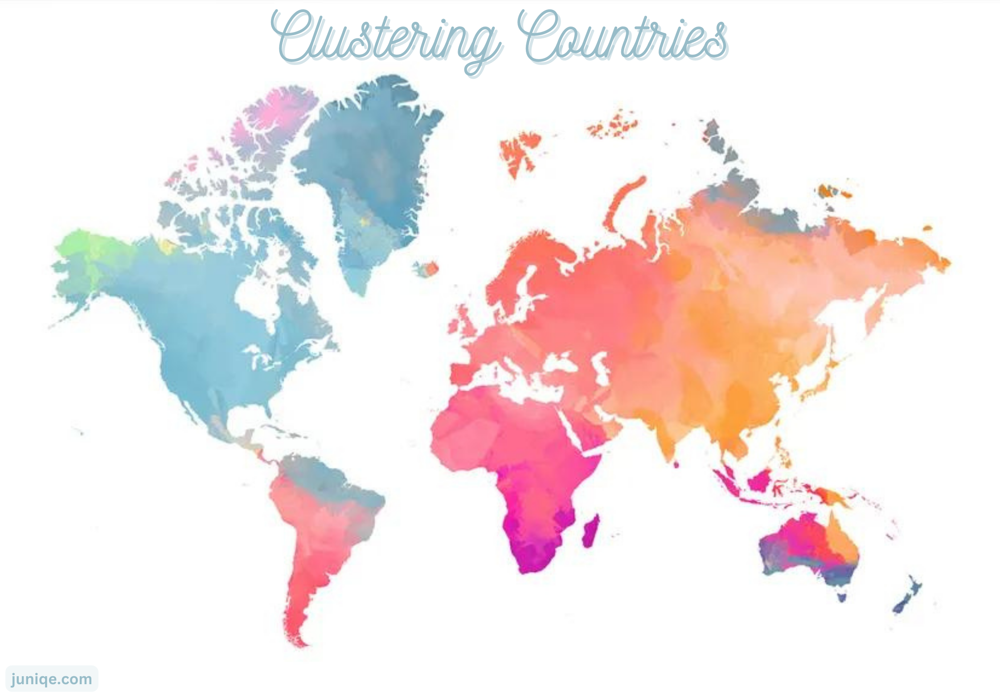

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

**🗺️Objective:** 
    
The goal of this project is to cluster countries based on various numerical features such as economic indicators, health factors, and social parameters. This is an unsupervised learning problem because we do not have any predefined categories or labels for the countries. We need to use machine learning techniques to create clusters of similar countries based on their features. The resulting clusters will help in the allocation of funds for assistance during natural disasters and calamities, as countries with similar characteristics are likely to face similar challenges during such events.

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
|       | **Attribute** | **Information** |
| :---  |     :---      |       :---      |      
| **1** | **Country** | Name of the country |                
| **2** | **Child Mortality** | Death of children under 5 years of age per 1000 live births |                        
| **3** | **Exports** | Exports of goods and services per capita. Given as %age of the GDP per capita |
| **4** | **Health** | Total health spending per capita. Given as %age of GDP per capita |
| **5** | **Imports** | Imports of goods and services per capita. Given as %age of the GDP per capita |                     
| **6** | **Income** | Net annual income per person |
| **7** | **Inflation** | The measurement of the annual growth rate of the Total GDP |  
| **8** | **Life Expectancy** | The average number of years a new born child would live if the current mortality patterns are to remain the same |                      
| **9** | **Total Fertility** | The number of children that would be born to each woman if the current age-fertility rates remain the same |
| **10** | **GDPP** |The GDP per capita. Calculated as the Total GDP divided by the total population. |

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">1. Import Libraries</p> 

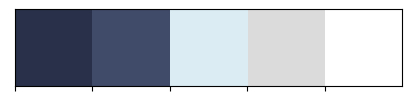

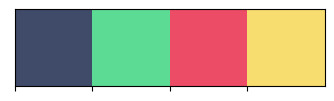

In [1]:
# Data
import pandas as pd
import numpy as np
from scipy import stats

# tqdm library for progress bars
from tqdm import tqdm

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import iplot
from termcolor import colored

# Clustering Algorithms
from sklearn.cluster import KMeans

# PCA
from sklearn.decomposition import PCA

# kneed library for finding the knee/elbow point in a plot
from kneed import KneeLocator, DataGenerator

# sklearn library
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Scaling
from sklearn.preprocessing import StandardScaler

# ignoring the warnings while executing codes
import warnings
warnings.filterwarnings('ignore')

# Color pallet and theme
import matplotlib.colors

# Define custom colors
"#283149"  # Dark blue
"#404B69"  # Medium blue
"#DBEDF3"  # Light blue
"#DBDBDB"  # Gray
"#FFFFFF"  # White

colors = ["#283149", "#404B69", "#DBEDF3", "#DBDBDB", "#FFFFFF"]
colors2 = ["#FFFFFF", "#DBDBDB", "#DBEDF3", "#404B69", "#283149"]
colors3 = ['#404B69', '#5CDB95', '#ED4C67', '#F7DC6F']

my_palette = sns.color_palette(["#283149", "#404B69", "#DBEDF3", "#DBDBDB", "#FFFFFF"])

cmap = matplotlib.colors.ListedColormap(colors)
cmap2 = matplotlib.colors.ListedColormap(colors2)

# Main Theme
sns.palplot(sns.color_palette(colors))

# Clusters Theme
sns.palplot(sns.color_palette(colors3))

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">2. Reading and Understanding the Dataset</p> 

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">2.1. Import Dataset</p>

In [2]:
Data = pd.read_csv('E:/Country-data.csv')

In [3]:
# Preview the dataset
df = pd.DataFrame(Data)
df.head(5)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">2.2. Discover Data</p>

In [4]:
# View dimensions of dataset   
rows, col = df.shape
print ("Dimensions of dataset: {}" . format (df.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (167, 10)
Rows: 167 
Columns: 10


In [5]:
# Dtype
print(f'The data type contains:\n object --> {df.dtypes.value_counts()[2]}\n int64 --> {df.dtypes.value_counts()[1]}\n float64 --> {df.dtypes.value_counts()[0]}')

The data type contains:
 object --> 1
 int64 --> 2
 float64 --> 7


In [6]:
# Information about the dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">    
    <strong>📝The information of data:</strong> 
    <br>
    
- The **country** data type is classified as an **object**, while **income** and **gdpp** data types are categorized as **int64**. The remaining data types are represented as **float64**.

In [7]:
# Statistical details
def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """
    color = 'red' if val < 0 else 'black'
    return f'color: {color}'

df_desc = df.describe(include=[np.float64, np.int64]).T.sort_values(by='std', ascending=False)
df_desc.style.background_gradient(cmap=cmap2)\
             .bar(subset=["max"])\
             .bar(subset=["mean"])\
             .applymap(color_negative_red)

,count,mean,std,min,25%,50%,75%,max
income,167.000000,17144.688623,19278.067698,609.000000,3355.000000,9960.000000,22800.000000,125000.000000
gdpp,167.000000,12964.155689,18328.704809,231.000000,1330.000000,4660.000000,14050.000000,105000.000000
child_mort,167.000000,38.270060,40.328931,2.600000,8.250000,19.300000,62.100000,208.000000
exports,167.000000,41.108976,27.412010,0.109000,23.800000,35.000000,51.350000,200.000000
imports,167.000000,46.890215,24.209589,0.065900,30.200000,43.300000,58.750000,174.000000
inflation,167.000000,7.781832,10.570704,-4.210000,1.810000,5.390000,10.750000,104.000000
life_expec,167.000000,70.555689,8.893172,32.100000,65.300000,73.100000,76.800000,82.800000
health,167.000000,6.815689,2.746837,1.810000,4.920000,6.320000,8.600000,17.900000
total_fer,167.000000,2.947964,1.513848,1.150000,1.795000,2.410000,3.880000,7.490000


In [8]:
#Describe the column with object type
df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
country,167,167,Afghanistan,1


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">    
    <strong>📝The table above shows:</strong> 
    <br>
    
- There are **167** data recorded for all features.
- The **minimum value** of **inflation** demonstrates a **negative value**.

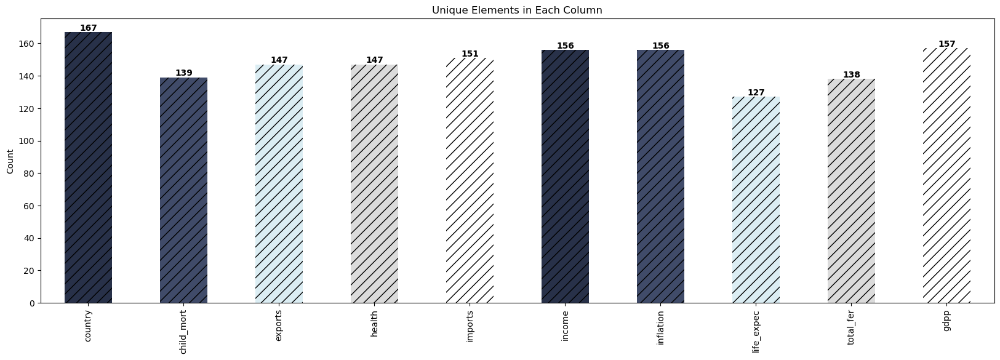

In [9]:
# Plot the unique values
unique = df.nunique()
plt.figure(figsize=(20, 6))
unique.plot(kind='bar', color=colors, hatch='//')
plt.title('Unique Elements in Each Column')
plt.ylabel('Count')
for i, v in enumerate(unique.values):
    plt.text(i, v+1, str(v), color='black', fontweight='bold', ha='center')
plt.show()

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">3. Preprocessing</p> 

📌Let's first update our knowledge about the 'inflation' feature.

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

🔍To determine whether the negative values in the **inflation** feature should be removed from our dataset, further investigation is needed to assess their reliability.

In [10]:
df.inflation.describe()

count    167.000000
mean       7.781832
std       10.570704
min       -4.210000
25%        1.810000
50%        5.390000
75%       10.750000
max      104.000000
Name: inflation, dtype: float64

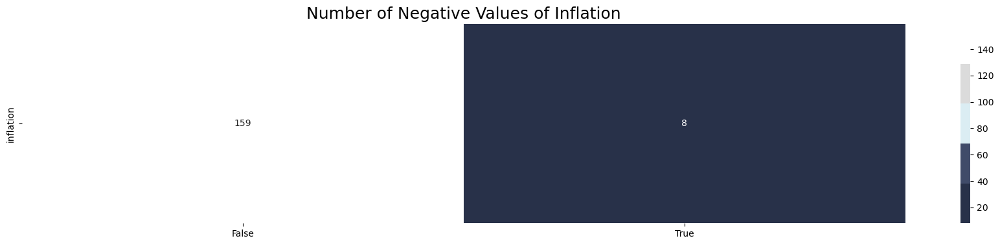

In [11]:
# Number of negative values of inflation
neg_values = df['inflation'] < 0

plt.figure(figsize=(22,4))
sns.heatmap(pd.DataFrame(neg_values.value_counts()).T, cmap=my_palette, 
            annot=True, fmt='0.0f').set_title('Number of Negative Values of Inflation', fontsize=18)
plt.show()

In [12]:
neg_indices = df.loc[neg_values].index
neg_indices

Int64Index([10, 43, 73, 77, 85, 131, 133, 135], dtype='int64')

In [13]:
df.iloc[neg_indices].style.set_properties(**{'background-color': "#DBEDF3"}, subset=['inflation'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
10,Bahamas,13.800000,35.000000,7.890000,43.700000,22900,-0.393000,73.800000,1.860000,28000
43,Czech Republic,3.400000,66.000000,7.880000,62.900000,28300,-1.430000,77.500000,1.510000,19800
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500
85,Latvia,7.800000,53.700000,6.680000,55.100000,18300,-0.812000,73.100000,1.360000,11300
131,Seychelles,14.400000,93.800000,3.400000,108.000000,20400,-4.210000,73.400000,2.170000,10800
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
135,Slovenia,3.200000,64.300000,9.410000,62.900000,28700,-0.987000,79.500000,1.570000,23400


<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌**Deflation**, or **negative inflation**, happens when prices generally fall in an economy. This can be because the supply of goods is higher than the demand for those goods, but can also have to do with the buying power of money becoming greater. Buying power can grow due to a reduction in the money supply, as well as a decrease in the supply of credit, which has a negative effect on consumer spending.

🔍[Reference](https://www.investopedia.com/ask/answers/111414/what-causes-negative-inflation-or-deflation.asp)

✅Therefore, these negative values hold significance in the real world and should not be excluded from the dataset.

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">4. Data Cleaning</p> 

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 4.1. Missing Values </p>

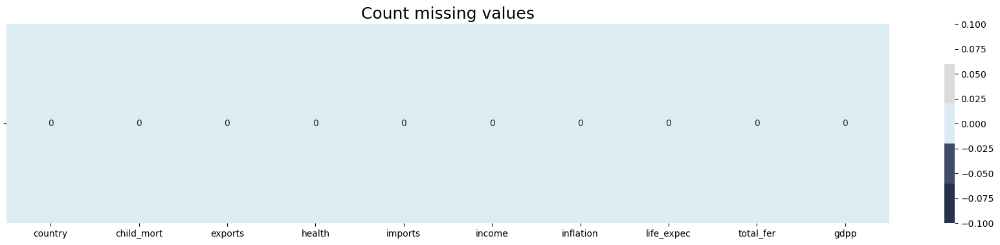

In [14]:
# Missing values
plt.figure(figsize=(22,4))
sns.heatmap((df.isna().sum()).to_frame(name='').T,cmap=my_palette, annot=True,
             fmt='0.0f').set_title('Count missing values', fontsize=18)
plt.show()

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.2. Duplicated Data</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Duplicate data** refers to the presence of identical records in a dataset, which can distort the analysis and lead to incorrect conclusions. Removing duplicates is crucial for accurate analysis and modeling.

In [15]:
# Duplicated data
df.duplicated().sum()

0

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.3. Outliers</p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌Investigating **Outliers** is an essential step in data analysis because they can significantly affect the statistical measures used to describe a dataset. Outliers are observations that differ significantly from other observations in the same dataset and can result from measurement errors, sampling issues, or genuine differences in the population. Identifying and dealing with outliers can help to improve the accuracy and reliability of statistical models and results, leading to more informed decisions and better outcomes. Therefore, outlier investigation is a crucial step in any data analysis process.

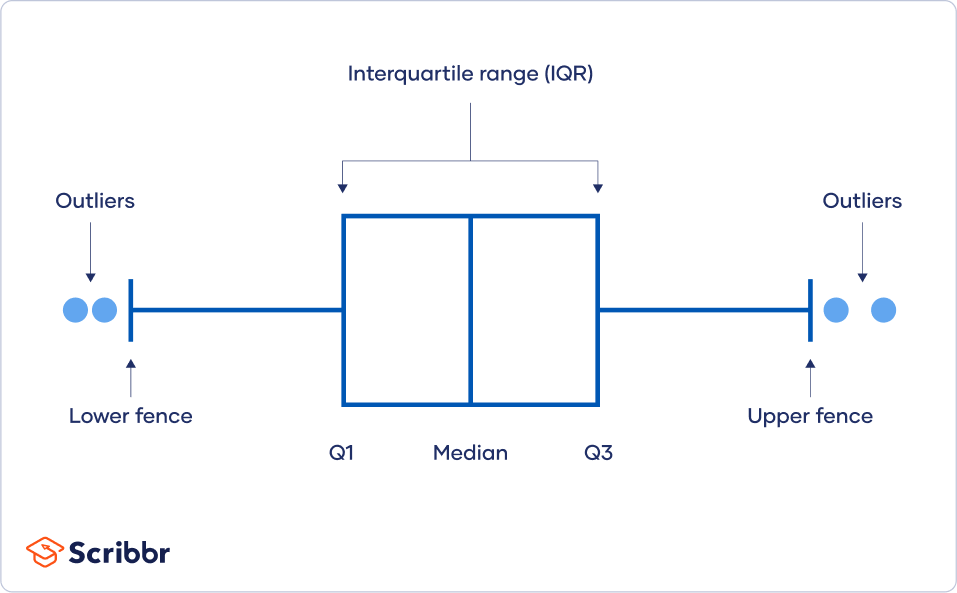

In [16]:
# Separate numerical and categorical features
num_cols = pd.DataFrame (df, columns= ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp'])
cat_cols = pd.DataFrame (df, columns= ['country'])

In [17]:
def plot_numerical_features_boxplots(data, columns_list, rows, cols, title):
    sns.set_style('darkgrid')
    fig, axs = plt.subplots(rows, cols, figsize=(15, 7), sharey=True)
    fig.suptitle(title, fontsize=25, y=1)
    axs = axs.flatten()
    outliers_df = pd.DataFrame(columns=['Column', 'Outlier_index', 'Outlier_values'])
    for i, col in enumerate(columns_list):
        sns.boxplot(x=data[col], color='#404B69', ax=axs[i])
        axs[i].set_title(f'{col} (skewness: {data[col].skew().round(2)})', fontsize=12)
        #----------------------------
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1
        outliers = ((data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR)))
        outliers_index = data[outliers].index.tolist()
        outliers_values = data[col][outliers].tolist()
        outliers_df = outliers_df.append({'Column': col, 'Outlier_index': outliers_index, 'Outlier_values': outliers_values}, ignore_index=True)
        axs[i].plot([], [], 'ro', alpha=0.5, label=f'Outliers: {outliers.sum()}')
        axs[i].legend(loc='upper right', fontsize=10)
    plt.tight_layout()
    return outliers_df

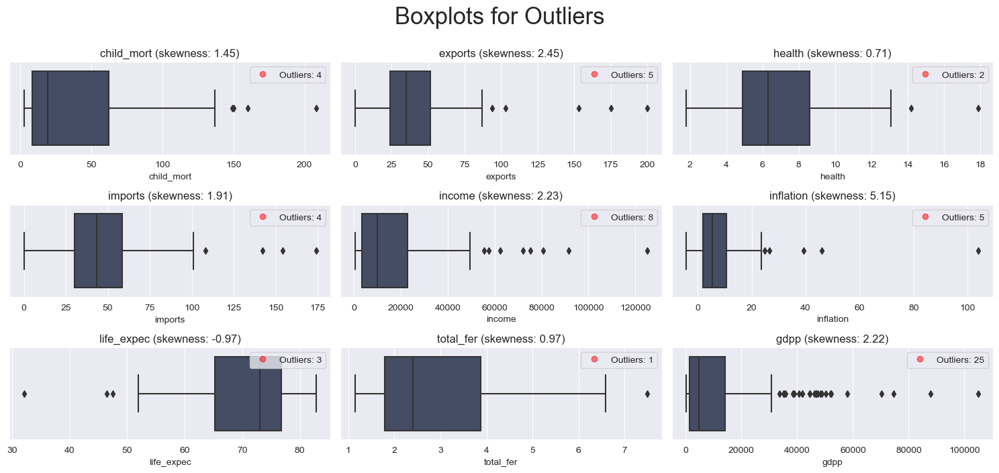

In [18]:
outliers_df = plot_numerical_features_boxplots(data=df, columns_list=num_cols, rows=3, cols=3, title='Boxplots for Outliers')

In [19]:
outliers_df

,Column,Outlier_index,Outlier_values
0,child_mort,"[31, 32, 66, 132]","[149.0, 150.0, 208.0, 160.0]"
1,exports,"[73, 91, 98, 131, 133]","[103.0, 175.0, 153.0, 93.8, 200.0]"
2,health,"[101, 159]","[14.2, 17.9]"
3,imports,"[91, 98, 131, 133]","[142.0, 154.0, 108.0, 174.0]"
4,income,"[23, 82, 91, 114, 123, 133, 145, 157]","[80600, 75200, 91700, 62300, 125000, 72100, 55..."
5,inflation,"[49, 103, 113, 149, 163]","[24.9, 39.2, 104.0, 26.5, 45.9]"
6,life_expec,"[31, 66, 87]","[47.5, 32.1, 46.5]"
7,total_fer,[112],[7.49]
8,gdpp,"[7, 8, 15, 23, 29, 44, 53, 54, 58, 68, 73, 75,...","[51900, 46900, 44400, 35300, 47400, 58000, 462..."


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣Our data is characterized by highly skewed distributions, with a prominent right-skewed (positively skewed) shape for most variables, including income, and a left-skewed (negatively skewed) shape for the life expectancy variable. 
-------
- 2️⃣The presence of many outliers is also a salient feature of our data. However, we should not discard any outliers as they represent real countries that need to be included in our analysis and may provide valuable insights for our research compared to countries with more moderate statistics.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200">4.4. Noises</p>

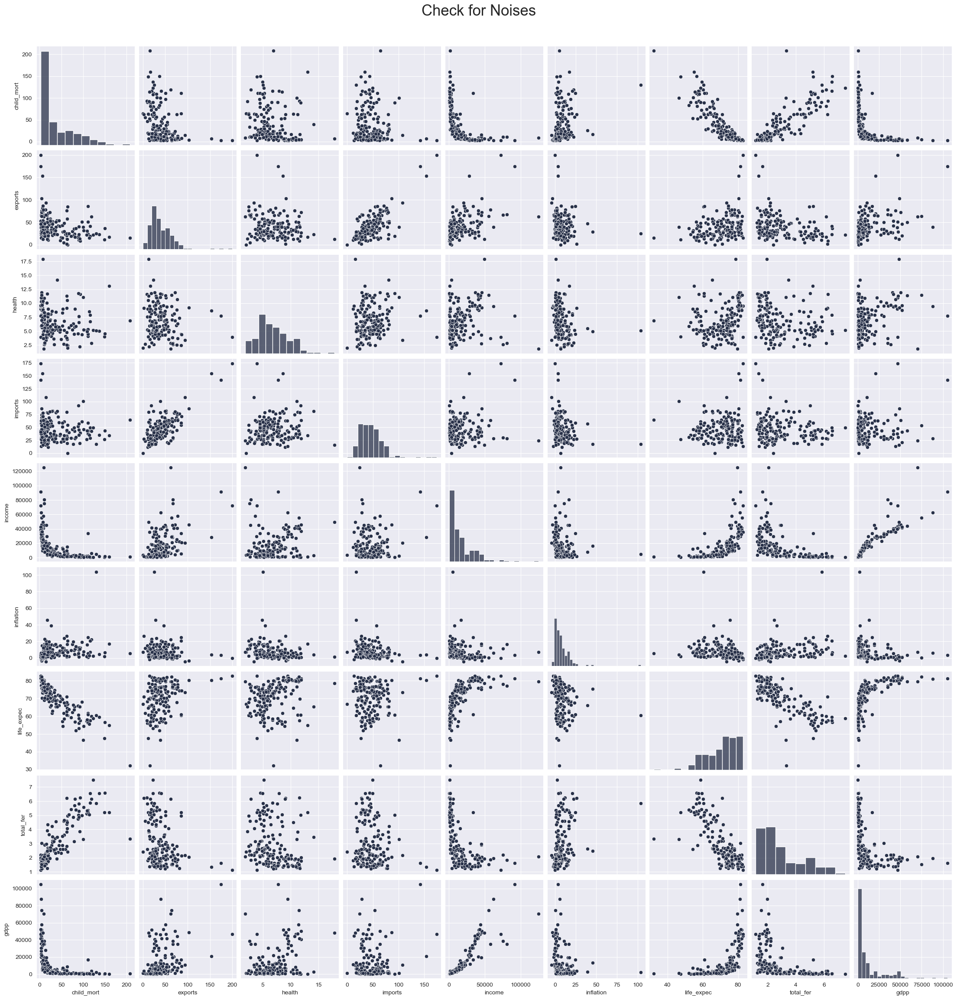

In [20]:
# pairplot for noises

colors = ["#283149", "#404B69", "#DBEDF3"]

num_variables = ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df[num_variables])
plt.suptitle('Check for Noises', y=1.03, fontsize=25)
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Although there appear to be some variables with noise, as I previously noted (they represent real countries that need to be included in our analysis and may provide valuable insights for our research compared to countries with more moderate statistics), we have chosen not to remove them from our dataset.

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">5. Exploratory Data Analysis (EDA)</p> 

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 5.1. Univariate Analysis </p>

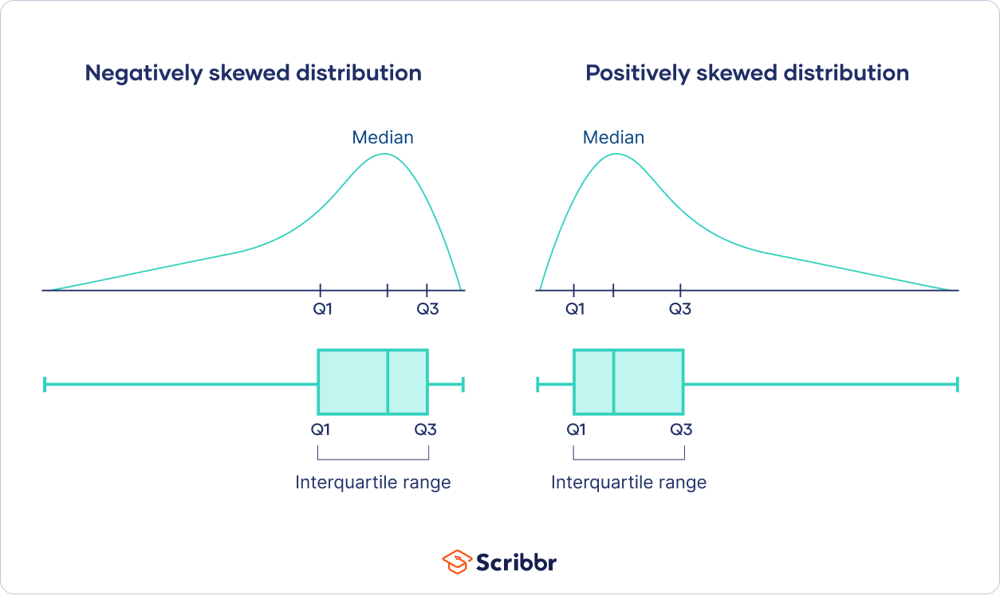

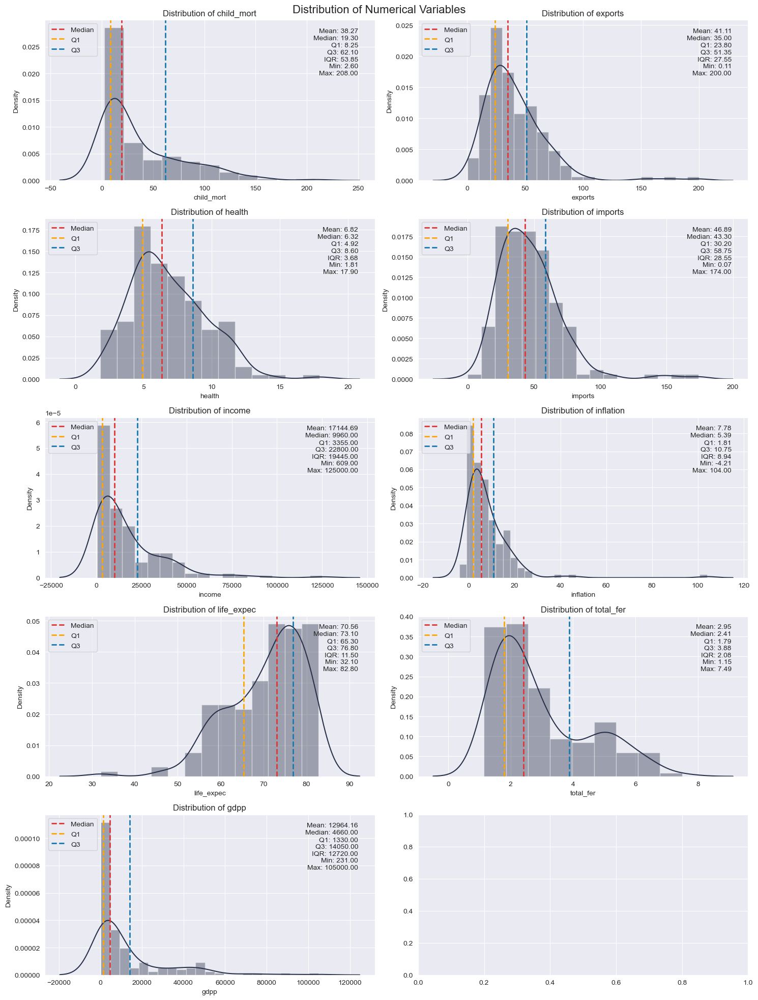

In [21]:
# Check variables distribution

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 20))

# Define colors to use for each feature
colors = ["#283149"]

# Loop through each column and plot distribution
for i, column in enumerate(num_cols):
    # Plot histogram with density curve
    sns.distplot(df[column], color=colors[i%1], ax=axes[i//2, i%2])
    
    # Add vertical lines for mean, median, Q1 and Q3
    axes[i//2, i%2].axvline(x=df[column].median(), color='#e33434', linestyle='--', linewidth=2, label='Median')
    axes[i//2, i%2].axvline(x=df[column].quantile(0.25), color='orange', linestyle='--', linewidth=2, label='Q1')
    axes[i//2, i%2].axvline(x=df[column].quantile(0.75), color='#177ab0', linestyle='--', linewidth=2, label='Q3')
    
    # Add text box with important statistics
    median = df[column].median()
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    axes[i//2, i%2].text(0.95, 0.95, 
                          'Mean: {:.2f}\nMedian: {:.2f}\nQ1: {:.2f}\nQ3: {:.2f}\nIQR: {:.2f}\nMin: {:.2f}\nMax: {:.2f}'.format(
                              df[column].mean(), median, q1, q3, iqr, df[column].min(), df[column].max()),
                          transform=axes[i//2, i%2].transAxes,
                          fontsize=10, va='top', ha='right')
    
    # Add legend
    axes[i//2, i%2].legend(loc = "upper left")
    
    # Set title of subplot
    axes[i//2, i%2].set_title('Distribution of '+ column)
    
# Add overall title and adjust spacing
fig.suptitle('Distribution of Numerical Variables', fontsize=16)
fig.tight_layout()

In [22]:
# Check variables skewness

# create a list of features to check
features = ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

# create an empty DataFrame to store the results
skew_df = pd.DataFrame(columns=['Feature', 'Skewness_type'])

# loop over each feature and calculate its skewness
for feature in features:
    skew = df[feature].skew()
    
    # determine whether the skewness is positive or negative
    if skew > 0:
        skewness = 'Positively skewed'
    elif skew < 0:
        skewness = 'Negatively skewed'
    else:
        skewness = 'Symmetric'
    
    # add the results to the DataFrame
    skew_df = skew_df.append({'Feature': feature, 'Skewness_type': skewness, 'Skewness_value': skew}, ignore_index=True)

skew_df.style.background_gradient(cmap=cmap2).set_properties(**{'font-family': 'Segoe UI'}).hide_index()

Feature,Skewness_type,Skewness_value
child_mort,Positively skewed,1.450774
exports,Positively skewed,2.445824
health,Positively skewed,0.705746
imports,Positively skewed,1.905276
income,Positively skewed,2.231480
inflation,Positively skewed,5.154049
life_expec,Negatively skewed,-0.970996
total_fer,Positively skewed,0.967092
gdpp,Positively skewed,2.218051


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- 1️⃣All four variables, namely **child_mort, exports, health, and imports**, exhibit a **positive skewness** and have numerous outliers. Especially **child mortality**, which is **highly skewed to the right**. While **most countries** have **low child mortality** rates, **a few countries** have **very high** rates. The **median** value is much closer to the **25th percentile** than to the **75th percentile**. This feature is likely to play a **crucial** role in dividing countries into different clusters.
----------
- 2️⃣Both **income per capita** and **inflation** exhibit **positive skewness**, with a noticeable **right-skewed** distribution and a significant presence of outliers, particularly in the case of **inflation**. While **most countries** have relatively **low inflation** rates, there are **a few countries** with **very high** rates. Similarly, the **majority of countries** have an **income per capita** lower than approximately **25,000**.
----------
- 3️⃣**Life expectancy** has a distinctive **left-skewed (negative skewness)** distribution, which makes it susceptible to outliers. While **most countries** have a **life expectancy** of over **65**, there are **a few countries** where **life expectancy** is **considerably lower**, around **30 or 50**. This disparity suggests the presence of a potentially significant factor that could be used to divide the data.
----------
- 4️⃣**Fertility** rates exhibit a distinct **right-skewed** distribution **(positive skewness)**, with a considerable number of observations located at the right tail of the data. While **many countries** have relatively **low fertility** rates, around **2**, a **significant** number of countries have **higher** rates of **4 and 6**.
----------    
- 5️⃣The distribution of **GDP per capita** is highly **right-skewed**, with the **majority** of countries having a **GDP per capita** below **15,000**. However, there are also **several countries** with a **GDPP** that is **2-3 times higher** than this amount, indicating significant variability in economic development across countries.

In [23]:
# Features of each country

# Define a list of colors to use
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

# Get unique values of the "country" feature
countries = df.country.unique()

# Define variable names list
var_names = ['child_mort', 'exports', 'health', 'imports', 'inflation', 'life_expec', 'total_fer']

for i, country in enumerate(countries):
    # Select data
    country_data = df[df["country"] == country]

    # Create polar scatter plot with custom color
    data = [go.Scatterpolar(
            r=[country_data[var_name].values[0] for var_name in var_names],
            theta=var_names,
            fill='toself',
            line=dict(color=colors[i % len(colors)], width=2),
            marker=dict(color=colors[i % len(colors)], size=10))]

    # Define layout
    layout = go.Layout(
        polar=dict(
            radialaxis=dict(
                visible=True,
            )
        ),
        showlegend=False,
        title=f"{country}"
    )

    # Create figure and display plot
    fig = go.Figure(data=data, layout=layout)
    iplot(fig)

In [24]:
# Features of each country

# List of features
features = ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

# Loop through each feature and generate a choropleth map
for feature in features:
    fig = px.scatter_geo(df, locations='country', locationmode='country names', color=feature, color_continuous_scale='Viridis',
                         range_color=(0, df[feature].max()), title=f"Countries by {feature.replace('_', ' ').title()}",
                         labels={feature: feature.replace('_', ' ').title()}, height=700, projection='orthographic')

    # Add colorbar title
    fig.update_layout(coloraxis_colorbar=dict(title=feature.replace('_', ' ').title()))

    # Show the map
    fig.show()

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌To gain a better understanding of the features, we should conduct a more thorough assessment.

<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">1️⃣Child Mortality (Death of children under 5 years of age per 1000 live births)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Child mortality** is a crucial indicator of the overall health and well-being of a nation. It reflects the quality of healthcare, sanitation, and living standards.

In [25]:
sorted_df = df.sort_values('child_mort')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'child_mort')['country']
bottom_10 = sorted_df.nsmallest(10, 'child_mort')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

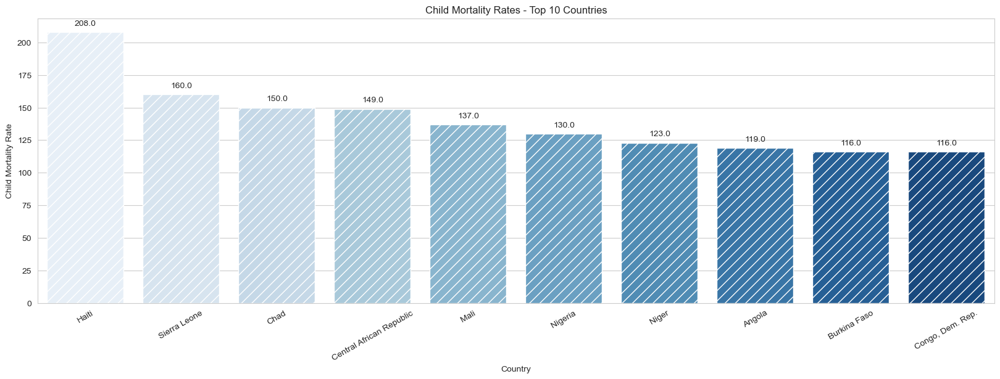

In [26]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='child_mort', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Child Mortality Rate')
plt.title('Child Mortality Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [27]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['child_mort'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
25,Burkina Faso,116.000000,19.200000,6.740000,29.600000,1430,6.810000,57.900000,5.870000,575
37,"Congo, Dem. Rep.",116.000000,41.100000,7.910000,49.600000,609,20.800000,57.500000,6.540000,334
3,Angola,119.000000,62.300000,2.850000,42.900000,5900,22.400000,60.100000,6.160000,3530
112,Niger,123.000000,22.200000,5.160000,49.100000,814,2.550000,58.800000,7.490000,348
113,Nigeria,130.000000,25.300000,5.070000,17.400000,5150,104.000000,60.500000,5.840000,2330
97,Mali,137.000000,22.800000,4.980000,35.100000,1870,4.370000,59.500000,6.550000,708
31,Central African Republic,149.000000,11.800000,3.980000,26.500000,888,2.010000,47.500000,5.210000,446
32,Chad,150.000000,36.800000,4.530000,43.500000,1930,6.390000,56.500000,6.590000,897
132,Sierra Leone,160.000000,16.800000,13.100000,34.500000,1220,17.200000,55.000000,5.200000,399
66,Haiti,208.000000,15.300000,6.910000,64.700000,1500,5.450000,32.100000,3.330000,662


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣Unfortunately, **Haiti** currently has the highest rate of child mortality in the world. The reasons for this are varied, including limited access to quality healthcare, insufficient sanitation, and poor living conditions.
------------
- 2️⃣**African countries** also struggle with high rates of child mortality. This is often due to a combination of factors, including inadequate healthcare facilities, a lack of clean water and sanitation, and widespread poverty. These factors contribute to the prevalence of infectious diseases, malnutrition, and other health problems that can prove fatal to young children.

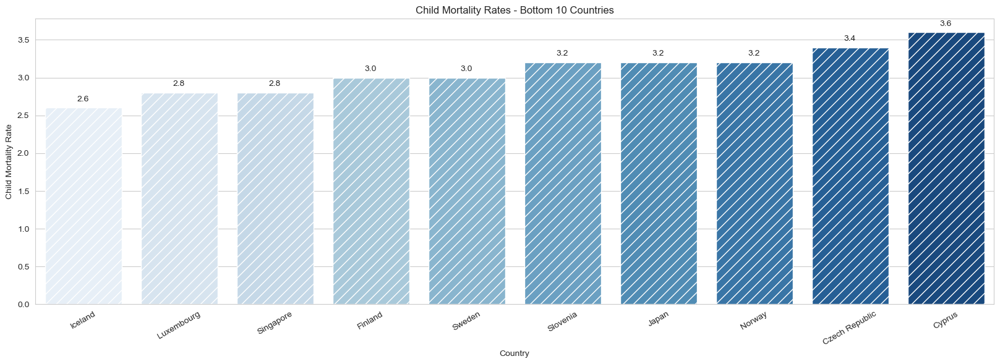

In [28]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='child_mort', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Child Mortality Rate')
plt.title('Child Mortality Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [29]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['child_mort'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
68,Iceland,2.600000,53.400000,9.400000,43.300000,38800,5.470000,82.000000,2.200000,41900
91,Luxembourg,2.800000,175.000000,7.770000,142.000000,91700,3.620000,81.300000,1.630000,105000
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
53,Finland,3.000000,38.700000,8.950000,37.400000,39800,0.351000,80.000000,1.870000,46200
144,Sweden,3.000000,46.200000,9.630000,40.700000,42900,0.991000,81.500000,1.980000,52100
135,Slovenia,3.200000,64.300000,9.410000,62.900000,28700,-0.987000,79.500000,1.570000,23400
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500
114,Norway,3.200000,39.700000,9.480000,28.500000,62300,5.950000,81.000000,1.950000,87800
43,Czech Republic,3.400000,66.000000,7.880000,62.900000,28300,-1.430000,77.500000,1.510000,19800
42,Cyprus,3.600000,50.200000,5.970000,57.500000,33900,2.010000,79.900000,1.420000,30800


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- 1️⃣Conversely, countries in **Asia and Europe** have made significant strides in reducing child mortality rates. This is due in part to their higher levels of economic development, which have enabled them to invest in better healthcare infrastructure, nutrition, and sanitation. These countries also tend to have more advanced healthcare systems, with better access to medical technologies and skilled healthcare professionals.
--------
- 2️⃣**In conclusion**, the stark differences in child mortality rates between different regions of the world reflect broader disparities in healthcare, economic development, and living standards. Addressing the root causes of high child mortality rates in Haiti and Africa will require concerted efforts to improve access to healthcare, sanitation, and economic opportunities. At the same time, countries in Asia and Europe must continue to invest in improving their healthcare systems to ensure that children have the best chance at a healthy future.

In [30]:
print('📌The risk of death for children under 5 years of age per 1000 live births varies greatly between countries. In fact, the highest mortality country (Haiti) has a risk of child mortality that is approximately', 
      round(df['child_mort'].max() / df['child_mort'].min(), 2),
      'times higher than the lowest mortality country Iceland.')

📌The risk of death for children under 5 years of age per 1000 live births varies greatly between countries. In fact, the highest mortality country (Haiti) has a risk of child mortality that is approximately 80.0 times higher than the lowest mortality country Iceland.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">2️⃣Exports (Exports of goods and services per capita. Given as % age of the GDP per capita)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Exports** refer to the goods and services that are produced domestically and sold to other countries. The nature of these exports is influenced by various factors such as geographical location, availability of natural resources, population size and their preferences for specific skills.

In [31]:
sorted_df = df.sort_values('exports')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'exports')['country']
bottom_10 = sorted_df.nsmallest(10, 'exports')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

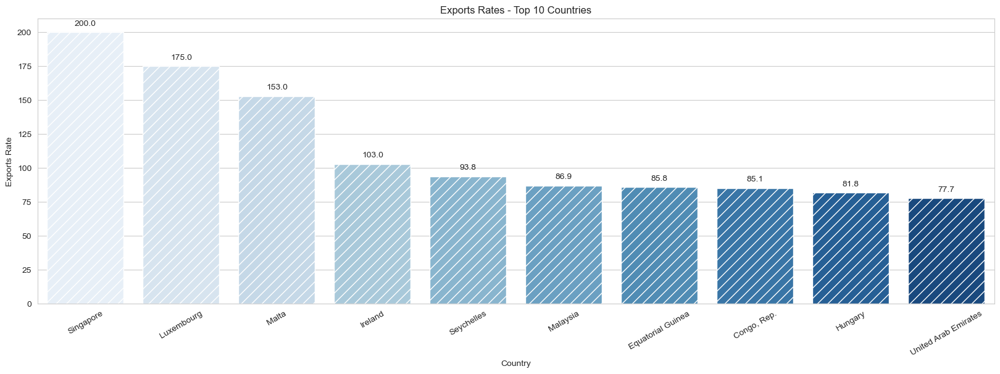

In [32]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='exports', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Exports Rate')
plt.title('Exports Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [33]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['exports'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
157,United Arab Emirates,8.600000,77.700000,3.660000,63.600000,57600,12.500000,76.500000,1.870000,35000
67,Hungary,6.000000,81.800000,7.330000,76.500000,22300,2.330000,74.500000,1.250000,13100
38,"Congo, Rep.",63.900000,85.100000,2.460000,54.700000,5190,20.700000,60.400000,4.950000,2740
49,Equatorial Guinea,111.000000,85.800000,4.480000,58.900000,33700,24.900000,60.900000,5.210000,17100
95,Malaysia,7.900000,86.900000,4.390000,71.000000,21100,7.270000,74.500000,2.150000,9070
131,Seychelles,14.400000,93.800000,3.400000,108.000000,20400,-4.210000,73.400000,2.170000,10800
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
98,Malta,6.800000,153.000000,8.650000,154.000000,28300,3.830000,80.300000,1.360000,21100
91,Luxembourg,2.800000,175.000000,7.770000,142.000000,91700,3.620000,81.300000,1.630000,105000
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Interestingly, **Singapore** has managed to become a leader in exports. Similarly, countries like **Luxembourg** and **Malta** have also achieved high export volumes by leveraging their unique strengths.

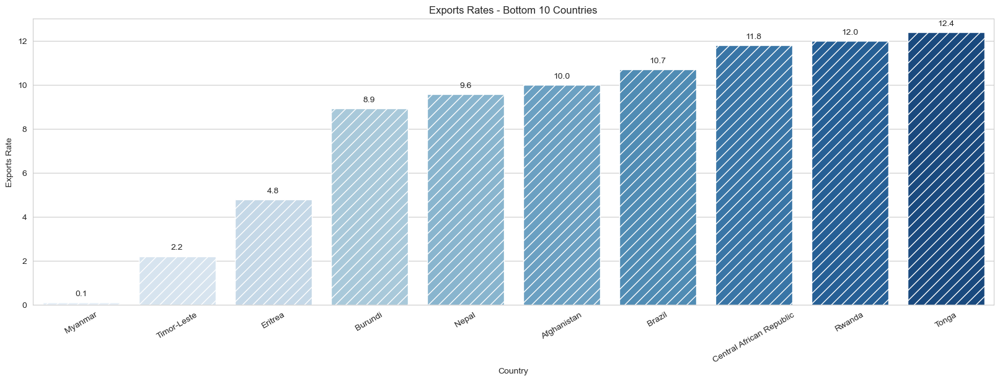

In [34]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='exports', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Exports Rate')
plt.title('Exports Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [35]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['exports'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
107,Myanmar,64.400000,0.109000,1.970000,0.065900,3720,7.040000,66.800000,2.410000,988
149,Timor-Leste,62.600000,2.200000,9.120000,27.800000,1850,26.500000,71.100000,6.230000,3600
50,Eritrea,55.200000,4.790000,2.660000,23.300000,1420,11.600000,61.700000,4.610000,482
26,Burundi,93.600000,8.920000,11.600000,39.200000,764,12.300000,57.700000,6.260000,231
109,Nepal,47.000000,9.580000,5.250000,36.400000,1990,15.100000,68.300000,2.610000,592
0,Afghanistan,90.200000,10.000000,7.580000,44.900000,1610,9.440000,56.200000,5.820000,553
22,Brazil,19.800000,10.700000,9.010000,11.800000,14500,8.410000,74.200000,1.800000,11200
31,Central African Republic,149.000000,11.800000,3.980000,26.500000,888,2.010000,47.500000,5.210000,446
126,Rwanda,63.600000,12.000000,10.500000,30.000000,1350,2.610000,64.600000,4.510000,563
151,Tonga,17.400000,12.400000,5.070000,60.300000,4980,3.680000,69.900000,3.910000,3550


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣On the other hand, countries like **Myanmar**, **Timor-Leste** and **Eritrea** have relatively low levels of exports. This can be attributed in part to their geographical location, which limits their access to international markets. Additionally, countries with small geographical areas often face constraints in terms of their ability to scale up production and transport goods over long distances.
--------
- 2️⃣**Generally**, the level of exports of a nation is a reflection of its economic potential and the extent to which it can participate in global trade. By leveraging their unique strengths and overcoming challenges, nations can strive to increase their exports and unlock greater economic opportunities.

In [36]:
print('📌The export volumes of Singapore is', 
      round(df['exports'].max() / df['exports'].min(), 2),
      'times higher than that of Myanmar.')

📌The export volumes of Singapore is 1834.86 times higher than that of Myanmar.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">3️⃣Health (Total health spending per capita. Given as % age of GDP per capita)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌Total **health** spending per capita is an important indicator of a country's commitment to providing quality healthcare services to its citizens. Countries with higher levels of healthcare spending are generally better equipped to provide access to quality healthcare services, which can lead to better health outcomes and improved quality of life for their citizens.

In [37]:
sorted_df = df.sort_values('health')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'health')['country']
bottom_10 = sorted_df.nsmallest(10, 'health')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

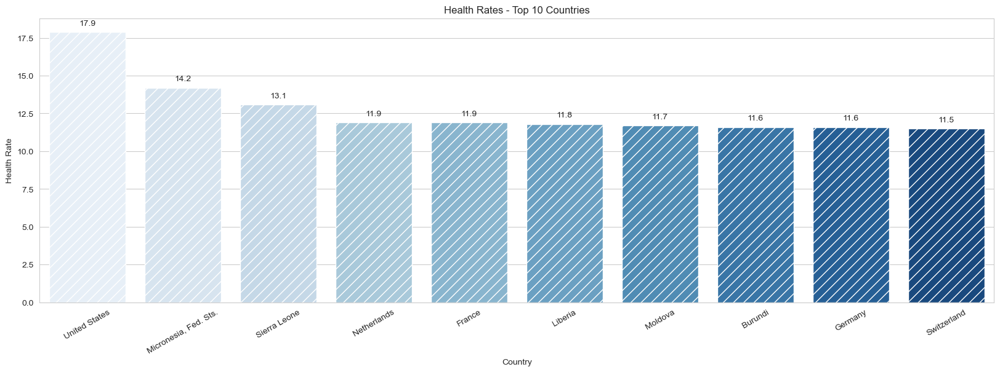

In [38]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='health', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Health Rate')
plt.title('Health Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [39]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['health'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
145,Switzerland,4.500000,64.000000,11.500000,53.300000,55500,0.317000,82.200000,1.520000,74600
26,Burundi,93.600000,8.920000,11.600000,39.200000,764,12.300000,57.700000,6.260000,231
58,Germany,4.200000,42.300000,11.600000,37.100000,40400,0.758000,80.100000,1.390000,41800
102,Moldova,17.200000,39.200000,11.700000,78.500000,3910,11.100000,69.700000,1.270000,1630
88,Liberia,89.300000,19.100000,11.800000,92.600000,700,5.470000,60.800000,5.020000,327
110,Netherlands,4.500000,72.000000,11.900000,63.600000,45500,0.848000,80.700000,1.790000,50300
54,France,4.200000,26.800000,11.900000,28.100000,36900,1.050000,81.400000,2.030000,40600
132,Sierra Leone,160.000000,16.800000,13.100000,34.500000,1220,17.200000,55.000000,5.200000,399
101,"Micronesia, Fed. Sts.",40.000000,23.500000,14.200000,81.000000,3340,3.800000,65.400000,3.460000,2860
159,United States,7.300000,12.400000,17.900000,15.800000,49400,1.220000,78.700000,1.930000,48400


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- The **United States** leads the world in healthcare spending, with individuals contributing 17.9% of the country's GDP to healthcare costs.

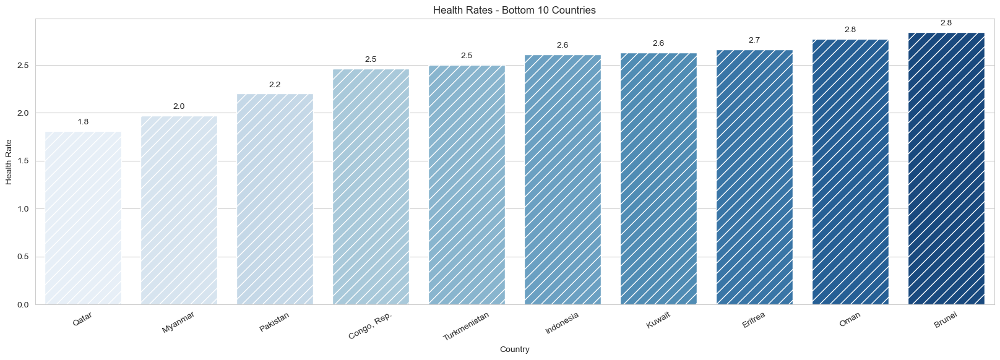

In [40]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='health', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Health Rate')
plt.title('Health Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [41]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['health'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
123,Qatar,9.000000,62.300000,1.810000,23.800000,125000,6.980000,79.500000,2.070000,70300
107,Myanmar,64.400000,0.109000,1.970000,0.065900,3720,7.040000,66.800000,2.410000,988
116,Pakistan,92.100000,13.500000,2.200000,19.400000,4280,10.900000,65.300000,3.850000,1040
38,"Congo, Rep.",63.900000,85.100000,2.460000,54.700000,5190,20.700000,60.400000,4.950000,2740
154,Turkmenistan,62.000000,76.300000,2.500000,44.500000,9940,2.310000,67.900000,2.830000,4440
70,Indonesia,33.300000,24.300000,2.610000,22.400000,8430,15.300000,69.900000,2.480000,3110
82,Kuwait,10.800000,66.700000,2.630000,30.400000,75200,11.200000,78.200000,2.210000,38500
50,Eritrea,55.200000,4.790000,2.660000,23.300000,1420,11.600000,61.700000,4.610000,482
115,Oman,11.700000,65.700000,2.770000,41.200000,45300,15.600000,76.100000,2.900000,19300
23,Brunei,10.500000,67.400000,2.840000,28.000000,80600,16.700000,77.100000,1.840000,35300


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣In contrast, many **Asian countries (including Qatar, Myanmar, Pakistan, etc.)** have much lower levels of healthcare spending, with some citizens spending less than 3% of their income on healthcare. This may reflect a lack of awareness or education around healthcare, or a lack of access to affordable healthcare services.
-------
- 2️⃣It is important to note, however, that healthcare spending levels can be influenced by a range of factors, including a country's economic development, healthcare policies, and cultural attitudes towards healthcare. Therefore, it would be inaccurate to generalize Asian citizens as "ignorant" about healthcare based solely on their healthcare spending levels.
-------
- 3️⃣Healthcare spending is an important indicator of a nation's commitment to providing quality healthcare to its citizens. By investing in healthcare infrastructure and promoting awareness around the importance of preventative care, nations can work towards improving the health and well-being of their populations.

In [42]:
print('📌The United States spends', 
      round(df['health'].max() / df['health'].min(), 2),
      'times more on healthcare than the country of Qatar.')

📌The United States spends 9.89 times more on healthcare than the country of Qatar.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">4️⃣Imports (Imports of goods and services per capita. Given as % age of the GDP per capita)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Imported** statistics offer valuable insights into a country's capacity to tackle its requirements and overcome challenges, even in the absence of some essential resources.

In [43]:
sorted_df = df.sort_values('imports')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'imports')['country']
bottom_10 = sorted_df.nsmallest(10, 'imports')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

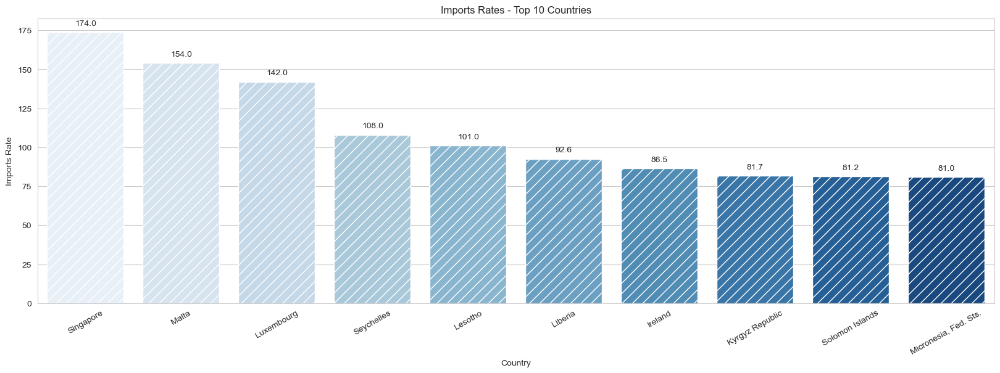

In [44]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='imports', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Imports Rate')
plt.title('Imports Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [45]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['imports'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
101,"Micronesia, Fed. Sts.",40.000000,23.500000,14.200000,81.000000,3340,3.800000,65.400000,3.460000,2860
136,Solomon Islands,28.100000,49.300000,8.550000,81.200000,1780,6.810000,61.700000,4.240000,1290
83,Kyrgyz Republic,29.600000,51.600000,6.180000,81.700000,2790,10.000000,68.500000,3.100000,880
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
88,Liberia,89.300000,19.100000,11.800000,92.600000,700,5.470000,60.800000,5.020000,327
87,Lesotho,99.700000,39.400000,11.100000,101.000000,2380,4.150000,46.500000,3.300000,1170
131,Seychelles,14.400000,93.800000,3.400000,108.000000,20400,-4.210000,73.400000,2.170000,10800
91,Luxembourg,2.800000,175.000000,7.770000,142.000000,91700,3.620000,81.300000,1.630000,105000
98,Malta,6.800000,153.000000,8.650000,154.000000,28300,3.830000,80.300000,1.360000,21100
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- For instance, countries like **Singapore, Malta, Luxembourg**, and **Seychelles** are among the top 5 in both exports and imports. This suggests that these nations have developed strategies to capitalize on their resources and create robust exports, while also relying on imports to balance their needs in other areas.

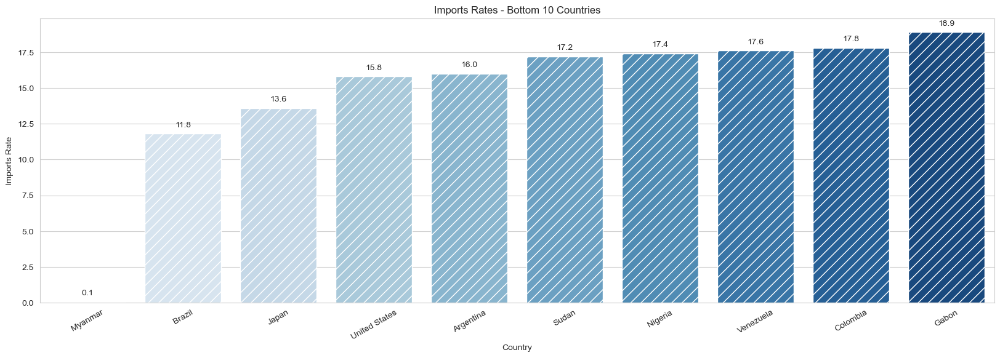

In [46]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='imports', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Imports Rate')
plt.title('Imports Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [47]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['imports'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
107,Myanmar,64.400000,0.109000,1.970000,0.065900,3720,7.040000,66.800000,2.410000,988
22,Brazil,19.800000,10.700000,9.010000,11.800000,14500,8.410000,74.200000,1.800000,11200
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500
159,United States,7.300000,12.400000,17.900000,15.800000,49400,1.220000,78.700000,1.930000,48400
5,Argentina,14.500000,18.900000,8.100000,16.000000,18700,20.900000,75.800000,2.370000,10300
142,Sudan,76.700000,19.700000,6.320000,17.200000,3370,19.600000,66.300000,4.880000,1480
113,Nigeria,130.000000,25.300000,5.070000,17.400000,5150,104.000000,60.500000,5.840000,2330
163,Venezuela,17.100000,28.500000,4.910000,17.600000,16500,45.900000,75.400000,2.470000,13500
35,Colombia,18.600000,15.900000,7.590000,17.800000,10900,3.860000,76.400000,2.010000,6250
55,Gabon,63.700000,57.700000,3.500000,18.900000,15400,16.600000,62.900000,4.080000,8750


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣In contrast, **Myanmar** has a very low import rate, at under **1%**. Similarly, **Brazil** has one of the lowest import rates among all nations, at just **11.8%**. **Sudan**, **Nigeria**, and **Gabon** are among the **African countries** that also have low import rates, with rates of **17.2%**, **17.4%**, and **18.9%**, respectively.
--------
- 2️⃣Generally, import statistics provide valuable insights into a nation's economic resilience and ability to address its needs through a combination of domestic production and international trade. By leveraging their strengths and identifying opportunities for growth, nations can work towards achieving a more balanced and sustainable economic future.

In [48]:
print('📌The import volumes of Singapore is', 
      round(df['imports'].max() / df['imports'].min(), 2),
      'times higher than that of Myanmar.')

📌The import volumes of Singapore is 2640.36 times higher than that of Myanmar.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">5️⃣Income (Net annual income per person)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Income** refers to the net annual income per person, which is the total income earned by an individual in a year, after deducting taxes and other mandatory contributions to social security and other programs. It is a measure of the financial resources available to an individual or household, and it is often used as a proxy for a country's overall economic prosperity.

In [49]:
sorted_df = df.sort_values('income')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'income')['country']
bottom_10 = sorted_df.nsmallest(10, 'income')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

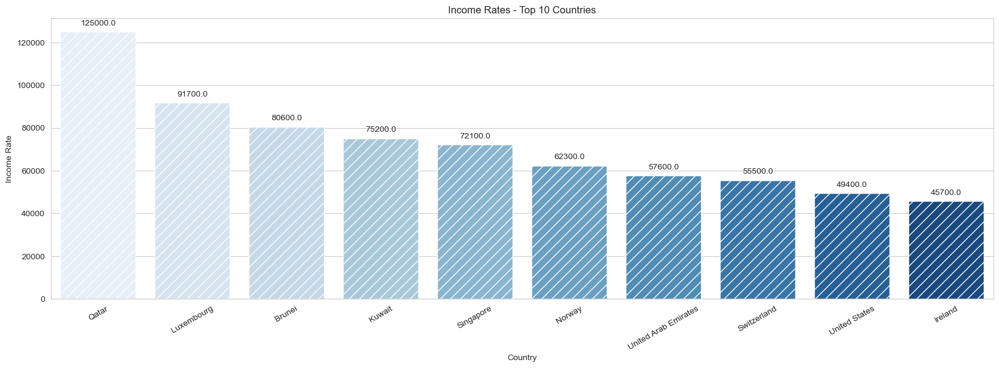

In [50]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='income', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Income Rate')
plt.title('Income Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [51]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['income'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
159,United States,7.300000,12.400000,17.900000,15.800000,49400,1.220000,78.700000,1.930000,48400
145,Switzerland,4.500000,64.000000,11.500000,53.300000,55500,0.317000,82.200000,1.520000,74600
157,United Arab Emirates,8.600000,77.700000,3.660000,63.600000,57600,12.500000,76.500000,1.870000,35000
114,Norway,3.200000,39.700000,9.480000,28.500000,62300,5.950000,81.000000,1.950000,87800
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
82,Kuwait,10.800000,66.700000,2.630000,30.400000,75200,11.200000,78.200000,2.210000,38500
23,Brunei,10.500000,67.400000,2.840000,28.000000,80600,16.700000,77.100000,1.840000,35300
91,Luxembourg,2.800000,175.000000,7.770000,142.000000,91700,3.620000,81.300000,1.630000,105000
123,Qatar,9.000000,62.300000,1.810000,23.800000,125000,6.980000,79.500000,2.070000,70300


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Citizens of **Qatar** enjoy the highest income levels of any country, with an average income of **$125,000** per year. **Singapore** and **Luxembourg** are also among the top 5 countries with the highest income levels.

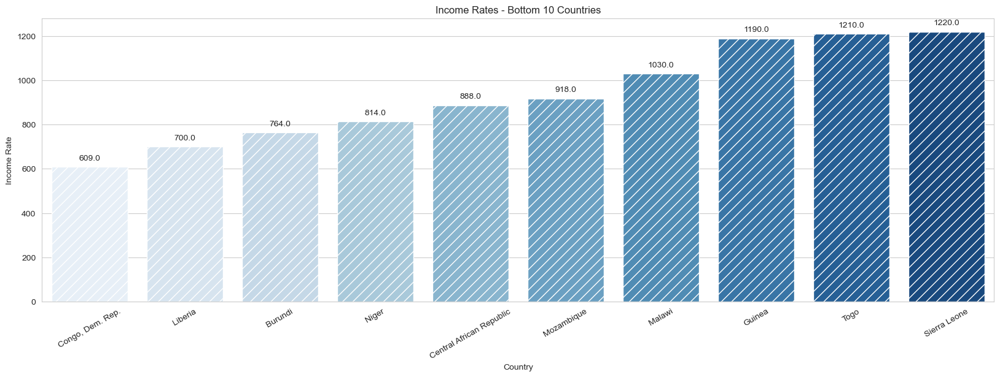

In [52]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='income', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Income Rate')
plt.title('Income Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [53]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['income'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
37,"Congo, Dem. Rep.",116.000000,41.100000,7.910000,49.600000,609,20.800000,57.500000,6.540000,334
88,Liberia,89.300000,19.100000,11.800000,92.600000,700,5.470000,60.800000,5.020000,327
26,Burundi,93.600000,8.920000,11.600000,39.200000,764,12.300000,57.700000,6.260000,231
112,Niger,123.000000,22.200000,5.160000,49.100000,814,2.550000,58.800000,7.490000,348
31,Central African Republic,149.000000,11.800000,3.980000,26.500000,888,2.010000,47.500000,5.210000,446
106,Mozambique,101.000000,31.500000,5.210000,46.200000,918,7.640000,54.500000,5.560000,419
94,Malawi,90.500000,22.800000,6.590000,34.900000,1030,12.100000,53.100000,5.310000,459
63,Guinea,109.000000,30.300000,4.930000,43.200000,1190,16.100000,58.000000,5.340000,648
150,Togo,90.300000,40.200000,7.650000,57.300000,1210,1.180000,58.700000,4.870000,488
132,Sierra Leone,160.000000,16.800000,13.100000,34.500000,1220,17.200000,55.000000,5.200000,399


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣At the lower end of the income spectrum, **African nations (including Sierra Leone, Togo, Guinea, etc.)** dominate, which is partly due to the historical damage inflicted by colonization that many of these countries have not yet fully recovered from.
-------
- 2️⃣The significant differences in income across the top, and lower ends of the spectrum have far-reaching implications for many other features, including healthcare, education, and infrastructure. This highlights the importance of working towards creating a more equitable distribution of wealth and resources across nations, which could lead to improved standards of living for all citizens.

In [54]:
print('📌Net annual income per person in Qatar is', 
      round(df['income'].max() / df['income'].min(), 2),
      'times higher than that of Congo, Dem. Rep.')

📌Net annual income per person in Qatar is 205.25 times higher than that of Congo, Dem. Rep.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">6️⃣Inflation (The measurement of the annual growth rate of the Total GDP)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Inflation** is a critical factor that can significantly impact the economy of a nation. When inflation is high, the purchasing power of citizens decreases, and countries with elevated inflation rates may experience severe economic challenges. In fact, having such high inflation rates can pose a risk to the very existence of the nation.

Conversely, low inflation rates, or deflation, can also be damaging to the economy. They signal an economy in decline, potentially leading to a recession or even a depression. Therefore, maintaining a healthy level of inflation is crucial for ensuring economic stability and sustainable growth.

In [55]:
neg_inflation = df.iloc[neg_indices]
neg_inflation = neg_inflation.sort_values('inflation')

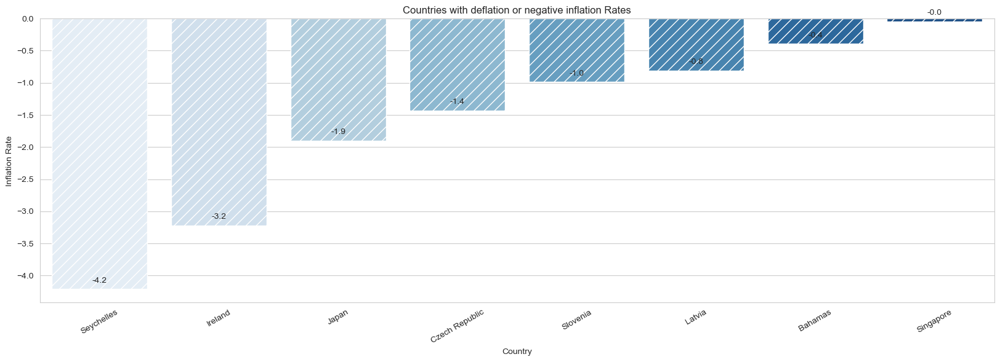

In [56]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='inflation', data=neg_inflation, palette='Blues', hatch='//')
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Inflation Rate')
plt.title('Countries with deflation or negative inflation Rates')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Nations experiencing deflation may not necessarily need financial aid solely because they are experiencing deflation. The need for financial aid would depend on various factors, such as the severity of the deflation, the causes of the deflation, and the overall economic conditions of the country.

In [57]:
sorted_df = df.sort_values('inflation')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'inflation')['country']
bottom_20 = sorted_df.nsmallest(20, 'inflation')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_20))

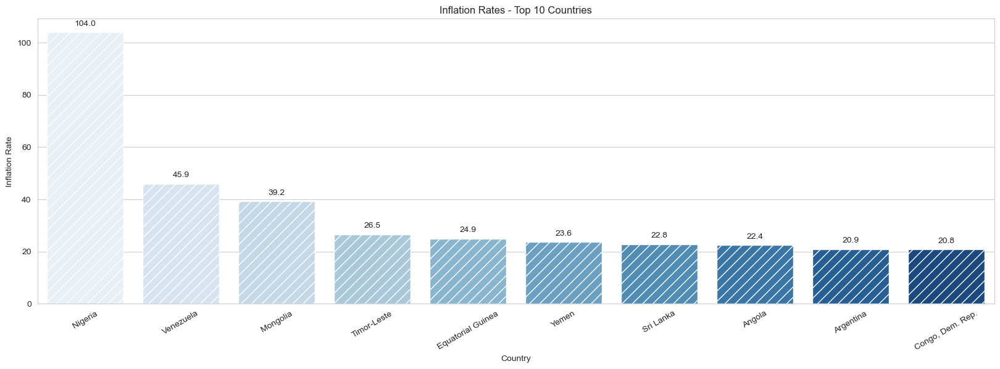

In [58]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='inflation', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Inflation Rate')
plt.title('Inflation Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [59]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['inflation'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
37,"Congo, Dem. Rep.",116.000000,41.100000,7.910000,49.600000,609,20.800000,57.500000,6.540000,334
5,Argentina,14.500000,18.900000,8.100000,16.000000,18700,20.900000,75.800000,2.370000,10300
3,Angola,119.000000,62.300000,2.850000,42.900000,5900,22.400000,60.100000,6.160000,3530
140,Sri Lanka,11.200000,19.600000,2.940000,26.800000,8560,22.800000,74.400000,2.200000,2810
165,Yemen,56.300000,30.000000,5.180000,34.400000,4480,23.600000,67.500000,4.670000,1310
49,Equatorial Guinea,111.000000,85.800000,4.480000,58.900000,33700,24.900000,60.900000,5.210000,17100
149,Timor-Leste,62.600000,2.200000,9.120000,27.800000,1850,26.500000,71.100000,6.230000,3600
103,Mongolia,26.100000,46.700000,5.440000,56.700000,7710,39.200000,66.200000,2.640000,2650
163,Venezuela,17.100000,28.500000,4.910000,17.600000,16500,45.900000,75.400000,2.470000,13500
113,Nigeria,130.000000,25.300000,5.070000,17.400000,5150,104.000000,60.500000,5.840000,2330


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Out of all the countries, **Nigeria** has the highest inflation rate, standing at 104. This means that the prices of goods and services in Nigeria have increased by 104 percent compared to the prices in the base year. The high inflation rate in Nigeria has been attributed to various factors such as a weakening currency, shortage of foreign exchange, rising food prices, and insecurity in some parts of the country. The high inflation rate has adversely affected the Nigerian economy, leading to lower purchasing power, reduced foreign investment, and higher unemployment rates. The Nigerian government has implemented various measures to curb inflation, including tightening monetary policies and increasing food production. However, these measures may take time to yield results, and it remains a significant challenge for the Nigerian government to stabilize the country's inflation rate.

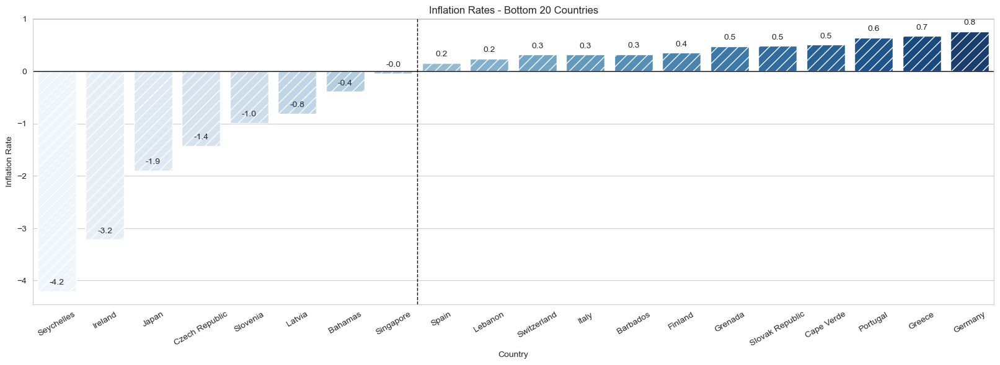

In [60]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='inflation', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_20)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add a horizontal and vertical line
ax.axhline(y=0, color='black', linewidth=1)
ax.axvline(x=7.5, color='black', linestyle='--', linewidth=1)

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Inflation Rate')
plt.title('Inflation Rates - Bottom 20 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [61]:
sorted_df.head(20).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['inflation'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
131,Seychelles,14.400000,93.800000,3.400000,108.000000,20400,-4.210000,73.400000,2.170000,10800
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500
43,Czech Republic,3.400000,66.000000,7.880000,62.900000,28300,-1.430000,77.500000,1.510000,19800
135,Slovenia,3.200000,64.300000,9.410000,62.900000,28700,-0.987000,79.500000,1.570000,23400
85,Latvia,7.800000,53.700000,6.680000,55.100000,18300,-0.812000,73.100000,1.360000,11300
10,Bahamas,13.800000,35.000000,7.890000,43.700000,22900,-0.393000,73.800000,1.860000,28000
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
139,Spain,3.800000,25.500000,9.540000,26.800000,32500,0.160000,81.900000,1.370000,30700
86,Lebanon,10.300000,35.800000,7.030000,60.200000,16300,0.238000,79.800000,1.610000,8860


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- Countries with low rates of inflation (including **Spain, Lebanon, Switzerland, Italy, Barbados, Finland, Portugal, Germany, etc.**) are generally considered to have stable economies, which can be seen as a positive economic indicator. Low inflation means that prices for goods and services are not rising rapidly, which can encourage spending and investment, leading to economic growth. This can also help to maintain the purchasing power of a country's currency and attract foreign investment.

<center> <span style="font-family:newtimeroman"> <span style="padding:100px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:100%;font-weight: 200;color:#404B69;overflow:hidden;">7️⃣Life expectancy (The average number of years a new born child would live if the current mortality patterns are to remain the same)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌**Life expectancy** is a statistical measure of the average time an organism is expected to live, based on the year of its birth, current age, and other demographic factors like sex.

In [62]:
sorted_df = df.sort_values('life_expec')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'life_expec')['country']
bottom_10 = sorted_df.nsmallest(10, 'life_expec')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

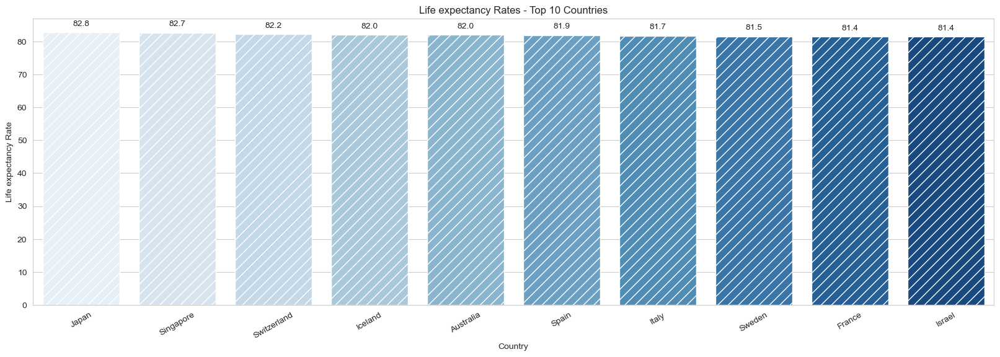

In [63]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='life_expec', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Life expectancy Rate')
plt.title('Life expectancy Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [64]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['life_expec'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
54,France,4.200000,26.800000,11.900000,28.100000,36900,1.050000,81.400000,2.030000,40600
74,Israel,4.600000,35.000000,7.630000,32.900000,29600,1.770000,81.400000,3.030000,30600
144,Sweden,3.000000,46.200000,9.630000,40.700000,42900,0.991000,81.500000,1.980000,52100
75,Italy,4.000000,25.200000,9.530000,27.200000,36200,0.319000,81.700000,1.460000,35800
139,Spain,3.800000,25.500000,9.540000,26.800000,32500,0.160000,81.900000,1.370000,30700
68,Iceland,2.600000,53.400000,9.400000,43.300000,38800,5.470000,82.000000,2.200000,41900
7,Australia,4.800000,19.800000,8.730000,20.900000,41400,1.160000,82.000000,1.930000,51900
145,Switzerland,4.500000,64.000000,11.500000,53.300000,55500,0.317000,82.200000,1.520000,74600
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Life expectancy is greatly influenced by factors such as mental health and lifestyle choices adopted by individuals. **Japan, Singapore, Switzerland, Australia**, and **Iceland** are among the top 5 countries with the highest life expectancy. However, interestingly, none of these countries with high life expectancy are among the top 5 countries that spend the most on healthcare.

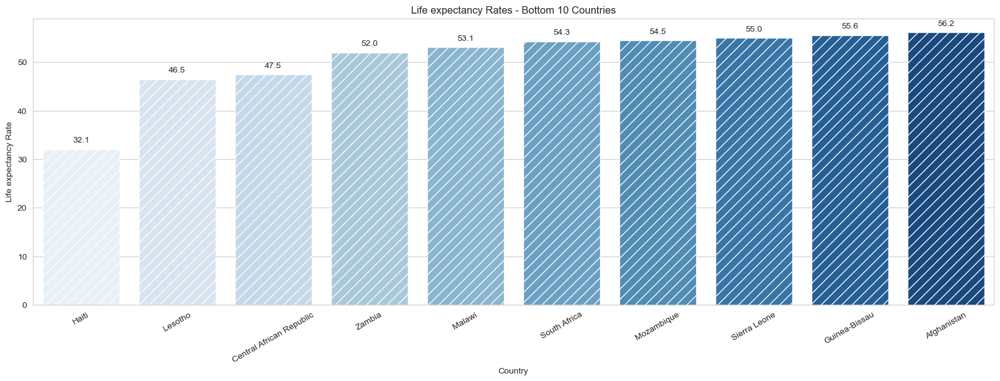

In [65]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='life_expec', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Life expectancy Rate')
plt.title('Life expectancy Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [66]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['life_expec'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
66,Haiti,208.000000,15.300000,6.910000,64.700000,1500,5.450000,32.100000,3.330000,662
87,Lesotho,99.700000,39.400000,11.100000,101.000000,2380,4.150000,46.500000,3.300000,1170
31,Central African Republic,149.000000,11.800000,3.980000,26.500000,888,2.010000,47.500000,5.210000,446
166,Zambia,83.100000,37.000000,5.890000,30.900000,3280,14.000000,52.000000,5.400000,1460
94,Malawi,90.500000,22.800000,6.590000,34.900000,1030,12.100000,53.100000,5.310000,459
137,South Africa,53.700000,28.600000,8.940000,27.400000,12000,6.350000,54.300000,2.590000,7280
106,Mozambique,101.000000,31.500000,5.210000,46.200000,918,7.640000,54.500000,5.560000,419
132,Sierra Leone,160.000000,16.800000,13.100000,34.500000,1220,17.200000,55.000000,5.200000,399
64,Guinea-Bissau,114.000000,14.900000,8.500000,35.200000,1390,2.970000,55.600000,5.050000,547
0,Afghanistan,90.200000,10.000000,7.580000,44.900000,1610,9.440000,56.200000,5.820000,553


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- On the other hand, **African countries** continue to rank lower in another feature, indicating that there may be challenges to providing adequate healthcare and promoting healthy lifestyles in those regions.

In [67]:
print('📌Life expectancy in Japan is', 
      round(df['life_expec'].max() / df['life_expec'].min(), 2),
      'times higher than that of Haiti.')

📌Life expectancy in Japan is 2.58 times higher than that of Haiti.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:120%;font-weight: 200;color:#404B69;overflow:hidden;">8️⃣Total fertility (The number of children that would be born to each woman if the current age-fertility rates remain the same)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">
    
📌The **total fertility** rate in a specific year is defined as the total number of children that would be born to each woman if she were to live to the end of her child-bearing years and give birth to children in alignment with the prevailing age-specific fertility rates.

In [68]:
sorted_df = df.sort_values('total_fer')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'total_fer')['country']
bottom_10 = sorted_df.nsmallest(10, 'total_fer')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

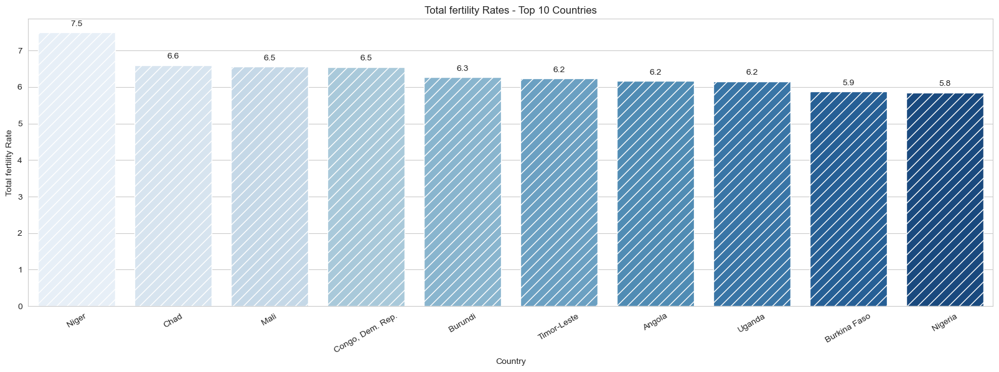

In [69]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='total_fer', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Total fertility Rate')
plt.title('Total fertility Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [70]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['total_fer'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
113,Nigeria,130.000000,25.300000,5.070000,17.400000,5150,104.000000,60.500000,5.840000,2330
25,Burkina Faso,116.000000,19.200000,6.740000,29.600000,1430,6.810000,57.900000,5.870000,575
155,Uganda,81.000000,17.100000,9.010000,28.600000,1540,10.600000,56.800000,6.150000,595
3,Angola,119.000000,62.300000,2.850000,42.900000,5900,22.400000,60.100000,6.160000,3530
149,Timor-Leste,62.600000,2.200000,9.120000,27.800000,1850,26.500000,71.100000,6.230000,3600
26,Burundi,93.600000,8.920000,11.600000,39.200000,764,12.300000,57.700000,6.260000,231
37,"Congo, Dem. Rep.",116.000000,41.100000,7.910000,49.600000,609,20.800000,57.500000,6.540000,334
97,Mali,137.000000,22.800000,4.980000,35.100000,1870,4.370000,59.500000,6.550000,708
32,Chad,150.000000,36.800000,4.530000,43.500000,1930,6.390000,56.500000,6.590000,897
112,Niger,123.000000,22.200000,5.160000,49.100000,814,2.550000,58.800000,7.490000,348


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- **African countries** have a significantly higher total fertility rate compared to other regions, with a dominant presence in the category of 5.84 or higher. This is in contrast to other regions such as Asia, Europe, and North America, which generally have lower total fertility rate.

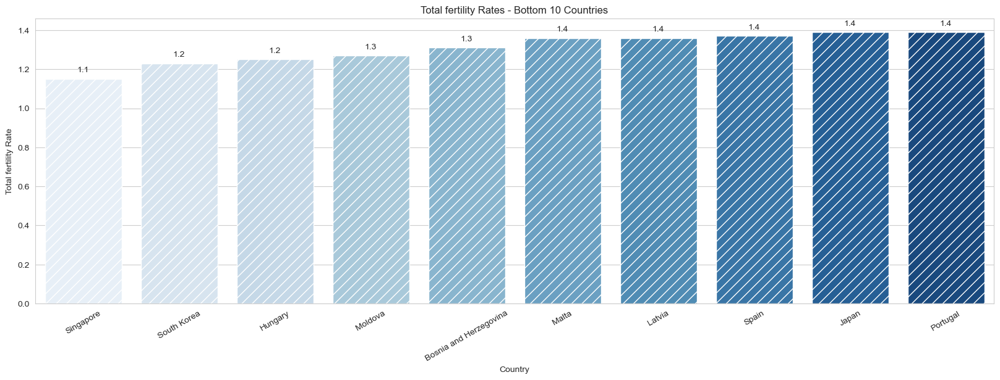

In [71]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='total_fer', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('Total fertility Rate')
plt.title('Total fertility Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [72]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['total_fer'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
133,Singapore,2.800000,200.000000,3.960000,174.000000,72100,-0.046000,82.700000,1.150000,46600
138,South Korea,4.100000,49.400000,6.930000,46.200000,30400,3.160000,80.100000,1.230000,22100
67,Hungary,6.000000,81.800000,7.330000,76.500000,22300,2.330000,74.500000,1.250000,13100
102,Moldova,17.200000,39.200000,11.700000,78.500000,3910,11.100000,69.700000,1.270000,1630
20,Bosnia and Herzegovina,6.900000,29.700000,11.100000,51.300000,9720,1.400000,76.800000,1.310000,4610
98,Malta,6.800000,153.000000,8.650000,154.000000,28300,3.830000,80.300000,1.360000,21100
85,Latvia,7.800000,53.700000,6.680000,55.100000,18300,-0.812000,73.100000,1.360000,11300
139,Spain,3.800000,25.500000,9.540000,26.800000,32500,0.160000,81.900000,1.370000,30700
77,Japan,3.200000,15.000000,9.490000,13.600000,35800,-1.900000,82.800000,1.390000,44500
122,Portugal,3.900000,29.900000,11.000000,37.400000,27200,0.643000,79.800000,1.390000,22500


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- Nations with low total fertility typically have a total fertility rate (TFR) of below 2.1 children per woman. Nations with low total fertility may also experience a decline in their population over time, which can have economic and social implications. 

In [73]:
print('📌TFR in Niger is', 
      round(df['total_fer'].max() / df['total_fer'].min(), 2),
      'times higher than that of Singapore.')

📌TFR in Niger is 6.51 times higher than that of Singapore.


<center> <span style="font-family:newtimeroman"> <span style="padding:50px;display:fill;border-radius:5px 5px;background-color:#DBDBDB;font-size:150%;font-weight: 200;color:#404B69;overflow:hidden;">9️⃣GDPP (The GDP per capita. Calculated as the Total GDP divided by the total population)</span>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌**GDP** per capita is a measure of a country's economic output that accounts for its population. It is calculated as the total GDP (Gross Domestic Product) of a country divided by the total population of that country.

This metric is used to assess the economic well-being of a population, as it provides an estimate of the average economic output per person in a given country. By dividing the total GDP by the population, we can get an idea of how much economic value is generated on average per person in a country.

GDP per capita is a commonly used economic indicator that can be used to compare the economic performance of different countries. It is often used as a key metric in evaluating a country's standard of living, economic growth, and overall economic health.

In [74]:
sorted_df = df.sort_values('gdpp')

# Get the top and bottom 10 countries by child_mort
top_10 = sorted_df.nlargest(10, 'gdpp')['country']
bottom_10 = sorted_df.nsmallest(10, 'gdpp')['country']

# Create a boolean mask for the top and bottom 10 countries
mask_top_bottom = df['country'].isin(list(top_10) + list(bottom_10))

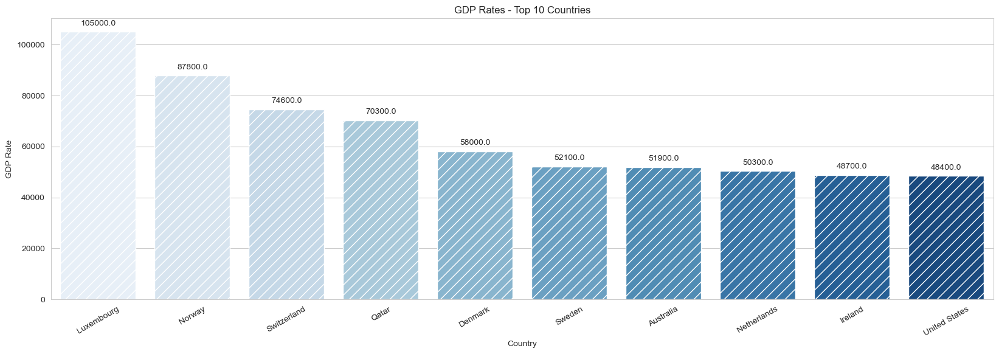

In [75]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='gdpp', data=df[mask_top_bottom], palette='Blues', hatch='//', order=top_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('GDP Rate')
plt.title('GDP Rates - Top 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [76]:
sorted_df.tail(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['gdpp'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
159,United States,7.300000,12.400000,17.900000,15.800000,49400,1.220000,78.700000,1.930000,48400
73,Ireland,4.200000,103.000000,9.190000,86.500000,45700,-3.220000,80.400000,2.050000,48700
110,Netherlands,4.500000,72.000000,11.900000,63.600000,45500,0.848000,80.700000,1.790000,50300
7,Australia,4.800000,19.800000,8.730000,20.900000,41400,1.160000,82.000000,1.930000,51900
144,Sweden,3.000000,46.200000,9.630000,40.700000,42900,0.991000,81.500000,1.980000,52100
44,Denmark,4.100000,50.500000,11.400000,43.600000,44000,3.220000,79.500000,1.870000,58000
123,Qatar,9.000000,62.300000,1.810000,23.800000,125000,6.980000,79.500000,2.070000,70300
145,Switzerland,4.500000,64.000000,11.500000,53.300000,55500,0.317000,82.200000,1.520000,74600
114,Norway,3.200000,39.700000,9.480000,28.500000,62300,5.950000,81.000000,1.950000,87800
91,Luxembourg,2.800000,175.000000,7.770000,142.000000,91700,3.620000,81.300000,1.630000,105000


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

**Luxembourg** has consistently been ranked among the top countries in the world in terms of economic prosperity, and it has yet again secured a top position in the latest rankings. This small landlocked country has a highly developed economy with a high GDP per capita, low unemployment rate, and a robust service sector that contributes significantly to its economic growth. **Switzerland**, another wealthy European country, is also among the top-ranked countries due to its high-income levels, strong currency, and a diversified economy. **Qatar**, a Middle Eastern country, is also among the top 5 countries in the rankings, thanks to its vast oil and gas reserves, which have contributed to the country's economic development and high per capita income. 

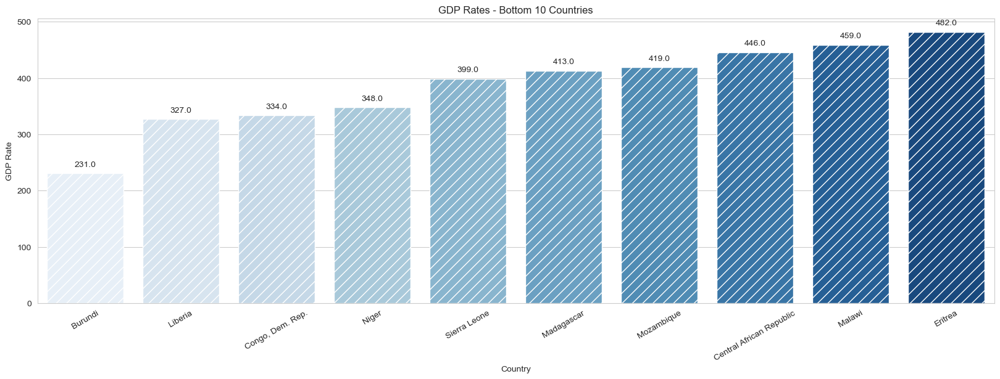

In [77]:
# Create the bar plot
plt.figure(figsize=(20,6))
sns.set_style('whitegrid')
ax = sns.barplot(x='country', y='gdpp', data=df[mask_top_bottom], palette='Blues', hatch='//', order=bottom_10)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.1f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

# Add labels and title
plt.xlabel('Country')
plt.ylabel('GDP Rate')
plt.title('GDP Rates - Bottom 10 Countries')

# Rotate the x-axis labels for better readability
plt.xticks(rotation=30)

# Display the plot
plt.show()

In [78]:
sorted_df.head(10).style.set_properties(**{'background-color': '#DBEDF3'}, subset=['gdpp'])

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
26,Burundi,93.600000,8.920000,11.600000,39.200000,764,12.300000,57.700000,6.260000,231
88,Liberia,89.300000,19.100000,11.800000,92.600000,700,5.470000,60.800000,5.020000,327
37,"Congo, Dem. Rep.",116.000000,41.100000,7.910000,49.600000,609,20.800000,57.500000,6.540000,334
112,Niger,123.000000,22.200000,5.160000,49.100000,814,2.550000,58.800000,7.490000,348
132,Sierra Leone,160.000000,16.800000,13.100000,34.500000,1220,17.200000,55.000000,5.200000,399
93,Madagascar,62.200000,25.000000,3.770000,43.000000,1390,8.790000,60.800000,4.600000,413
106,Mozambique,101.000000,31.500000,5.210000,46.200000,918,7.640000,54.500000,5.560000,419
31,Central African Republic,149.000000,11.800000,3.980000,26.500000,888,2.010000,47.500000,5.210000,446
94,Malawi,90.500000,22.800000,6.590000,34.900000,1030,12.100000,53.100000,5.310000,459
50,Eritrea,55.200000,4.790000,2.660000,23.300000,1420,11.600000,61.700000,4.610000,482


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

Despite the progress made in global economic growth and development, there is still a significant gap between countries with the highest and lowest levels of economic prosperity. Unfortunately, **African nations** are still among the countries at the lower end of the spectrum, which reflects their economic disadvantage. The majority of these countries face several economic challenges, including weak infrastructure, political instability, corruption, and insufficient investment in education and innovation. These factors make it difficult for these countries to attract foreign investment and create a business environment that promotes economic growth. As a result, many African countries continue to struggle with high levels of poverty, unemployment, and low levels of economic development. It is essential to address the root causes of these economic challenges and provide support to help these countries achieve sustainable economic growth and development. Efforts such as promoting investment, improving governance, reducing corruption, and investing in education and innovation are critical to help these nations break the cycle of economic disadvantage and achieve greater economic prosperity.

In [79]:
print("📌Luxembourg's GDP rate is", 
      round(df['gdpp'].max() / df['gdpp'].min(), 2),
      'times higher than that of Burundi.')

📌Luxembourg's GDP rate is 454.55 times higher than that of Burundi.


<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 5.2. Multivariate Analysis </p>

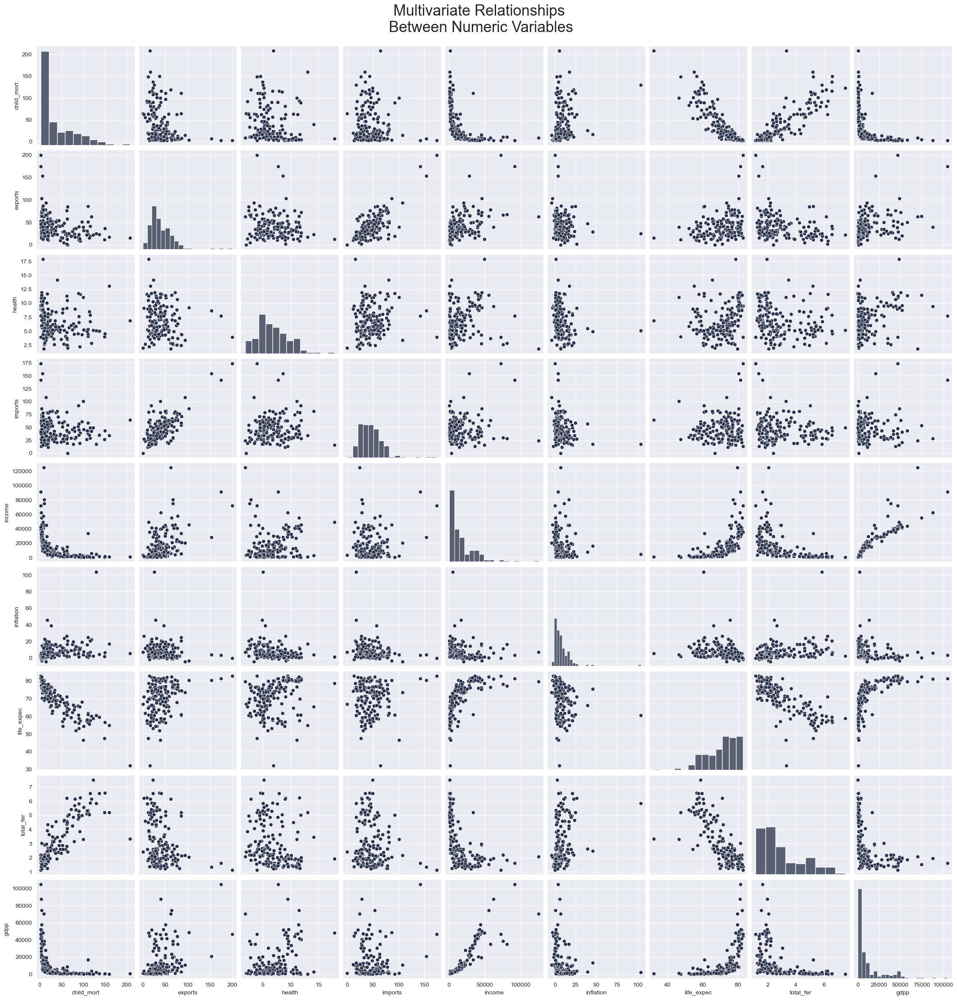

In [80]:
# Multivariate relationships between numeric variables
colors = ["#283149", "#404B69", "#DBEDF3"]

num_variables = ['child_mort', 'exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

sns.set_style('darkgrid')
sns.set_palette(colors)
sns.pairplot(df[num_variables])
plt.suptitle('Multivariate Relationships\n Between Numeric Variables', y=1.03, fontsize=25)
plt.show()

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌**Clustering analysis** is a widely used technique in data analysis and machine learning, where the goal is to group similar observations or data points into clusters. The **quality** of clustering heavily depends on the choice of variables or features used for clustering. In particular, **highly correlated** variables can **strongly impact** clustering analyses, especially if the algorithm used for clustering is **distance-based**.

<blockquote>Distance-based clustering algorithms measure the distance between data points in a high-dimensional space and use this distance measure to similar group points into clusters. However, when variables are highly correlated, the distance measure between observations can be exaggerated, leading to inaccurate clustering results. 
    
For instance, suppose we are clustering observations based on their socio-economic status, and we include both income and education as variables. These variables are often highly correlated, as people with higher incomes tend to have higher education levels. If we use both income and education for clustering, the algorithm might overemphasize the similarities or differences between observations, leading to biased clustering results. In such cases, dropping one of the variables, unless there is a serious reason to keep them, can be a good idea to avoid misleading clustering results.</blockquote>

**To summarize**, highly correlated variables can distort the similarities or differences between observations, leading to inaccurate clustering results. Hence, it is crucial to choose the right set of variables for clustering, and dropping correlated variables, when appropriate, can improve the quality of clustering.

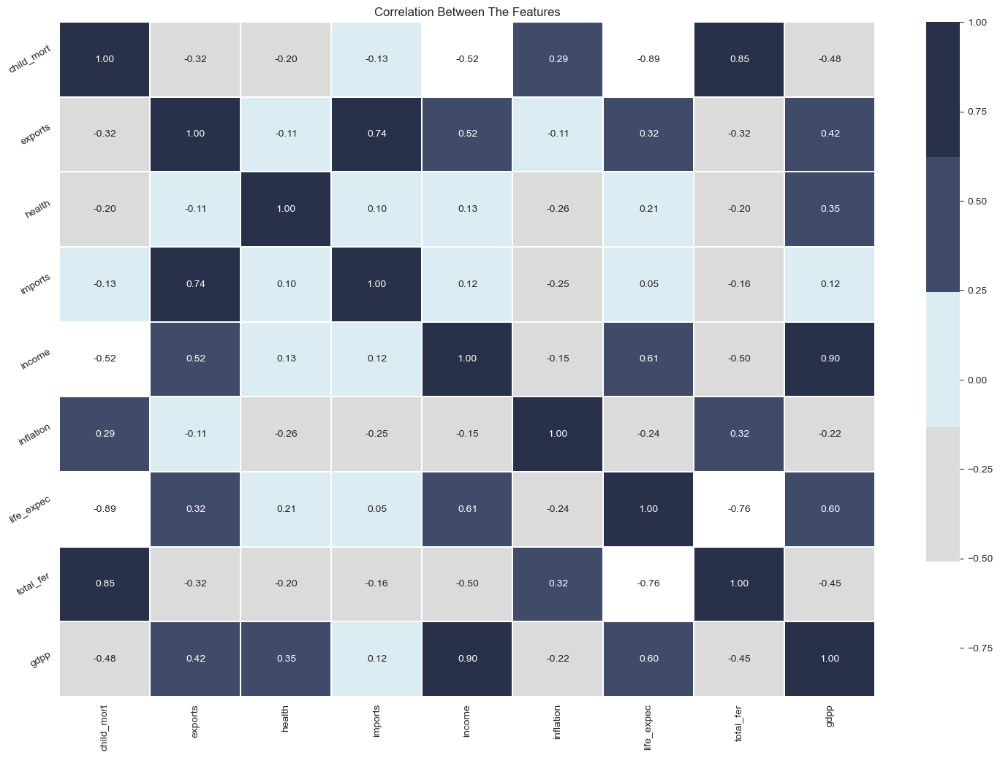

In [81]:
# Correlation between the features
fig=plt.gcf()
fig.set_size_inches(18, 12)
plt.title('Correlation Between The Features')
a = sns.heatmap(df.corr(), annot = True, cmap =cmap2, fmt='.2f', linewidths=0.2)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)
plt.show()

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌A **correlation coefficient** (r value) that ranges from **0.3 to 0.7** is generally viewed as indicating **moderate correlation**, while a coefficient **greater than 0.7** is indicative of **strong correlation**.    
🔍[Reference](https://www.amazon.com/Engineering-Statistics-Industrial-Bernard-Ostle/dp/0534265383)

In [82]:
# This function creates a correlation matrix to identify linear correlations between features and their correlation coefficient.
def corr_matrix(data):
    corr_matrix = data.corr()
    
    for var in corr_matrix.columns:
        # Keep only the correlation values that are greater than 0.7 and less than 1 in absolute value
        corr_matrix[var] = corr_matrix[var].apply(lambda x: x if abs(x) > 0.7 and abs(x) < 1 else '')
    
    return corr_matrix

In [83]:
corr_matrix(df)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,,,-0.886676,0.848478,
exports,,,,0.737381,,,,,
health,,,,,,,,,
imports,,0.737381,,,,,,,
income,,,,,,,,,0.895571
inflation,,,,,,,,,
life_expec,-0.886676,,,,,,,-0.760875,
total_fer,0.848478,,,,,,-0.760875,,
gdpp,,,,,0.895571,,,,


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣It is expected that **child mortality** and **life expectancy** have a **strong negative correlation** of **0.88**.
-----
- 2️⃣A **strong positive correlation** of **0.84** exists between **child mortality** and **total fertility**.
-----
- 3️⃣**Imports** and **exports** are **positively correlated** with a coefficient of **0.73**.
-----
- 4️⃣There is a **very strong positive correlation** of **0.89** between **income** and **GDP**, as expected.
-----
- 5️⃣**Fertility** and **life expectancy** are **negatively correlated** with a coefficient of **0.76**.

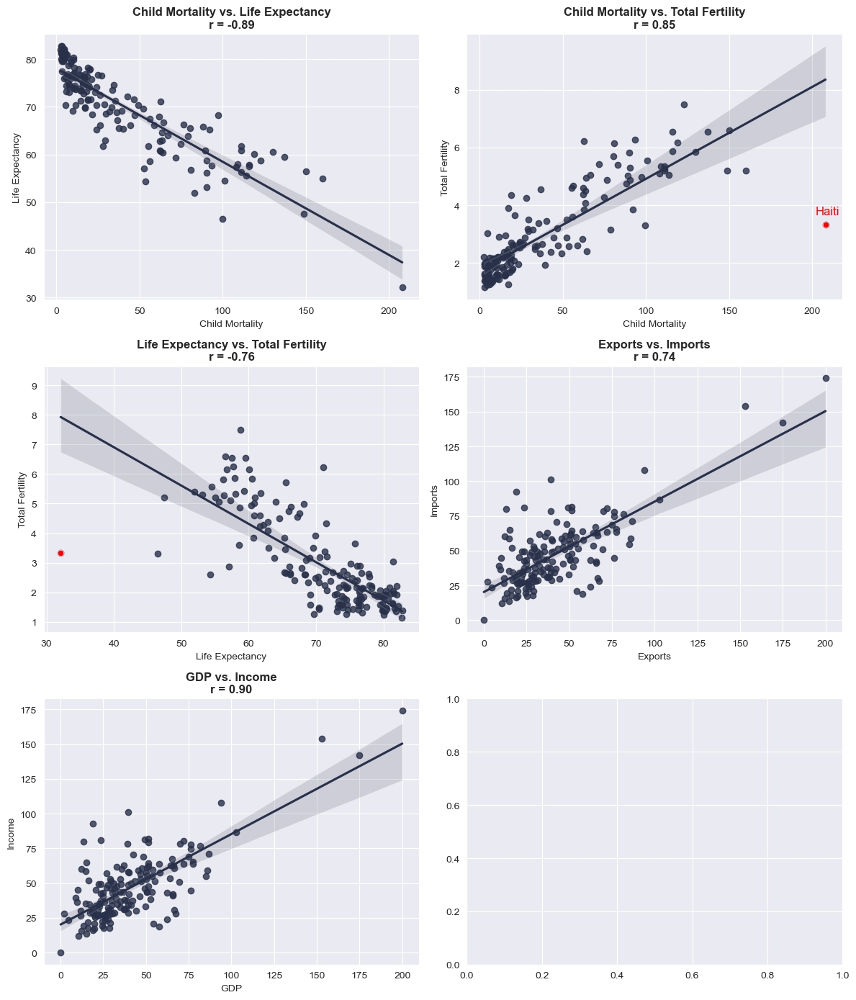

In [84]:
sns.set_style('darkgrid')
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 14))

# plot 1
sns.regplot(x='child_mort', y='life_expec', data=df, ax=axes[0][0])
r, p = stats.pearsonr(df['child_mort'], df['life_expec'])
axes[0][0].set_title('Child Mortality vs. Life Expectancy\nr = {:.2f}'.format(r), fontsize=12, fontweight='bold')
axes[0][0].set_xlabel('Child Mortality')
axes[0][0].set_ylabel('Life Expectancy')

# plot 2
point = df[(df['child_mort'] > 200) & (df['total_fer'] < 4)]
sns.regplot(x='child_mort', y='total_fer', data=df, ax=axes[0][1])
sns.scatterplot(x='child_mort', y='total_fer', data=point, color='red', ax=axes[0][1])
axes[0][1].annotate('Haiti', xy=(point['child_mort'], point['total_fer']), xytext=(-10, 10), textcoords='offset points', fontsize=12, color='red')
r, p = stats.pearsonr(df['child_mort'], df['total_fer'])
axes[0][1].set_title('Child Mortality vs. Total Fertility\nr = {:.2f}'.format(r), fontsize=12, fontweight='bold')
axes[0][1].set_xlabel('Child Mortality')
axes[0][1].set_ylabel('Total Fertility')

# plot 3
point = df[(df['life_expec'] < 35) & (df['total_fer'] > 3)]
sns.regplot(x='life_expec', y='total_fer', data=df, ax=axes[1][0])
sns.scatterplot(x='life_expec', y='total_fer', data=point, color='red', ax=axes[1][0])
axes[1][0].annotate('Haiti', xy=(point['total_fer'], point['life_expec']), xytext=(10, 10), textcoords='offset points', fontsize=12, color='red')
r, p = stats.pearsonr(df['life_expec'], df['total_fer'])
axes[1][0].set_title('Life Expectancy vs. Total Fertility\nr = {:.2f}'.format(r), fontsize=12, fontweight='bold')
axes[1][0].set_xlabel('Life Expectancy')
axes[1][0].set_ylabel('Total Fertility')

# plot 4
sns.regplot(x='exports', y='imports', data=df, ax=axes[1][1])
r, p = stats.pearsonr(df['exports'], df['imports'])
axes[1][1].set_title('Exports vs. Imports\nr = {:.2f}'.format(r), fontsize=12, fontweight='bold')
axes[1][1].set_xlabel('Exports')
axes[1][1].set_ylabel('Imports')

# plot 5
sns.regplot(x='exports', y='imports', data=df, ax=axes[2][0])
r, p = stats.pearsonr(df['gdpp'], df['income'])
axes[2][0].set_title('GDP vs. Income\nr = {:.2f}'.format(r), fontsize=12, fontweight='bold')
axes[2][0].set_xlabel('GDP')
axes[2][0].set_ylabel('Income')

# Adjust spacing between subplots
fig.tight_layout()

plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- 1️⃣In the first plot, we can see a **negative correlation** between **child mortality** and **life expectancy**. As **child mortality increases**, **life expectancy decreases**.
--------
- 2️⃣In the second plot, we can see a **positive correlation** between **child mortality** and **total fertility**. As **child mortality increases**, **total fertility also increases**.

  - Upon examining the scatterplot of **child mortality and total fertility**, we can conclude that the correlation between these two variables might have been even stronger if not for the presence of one outlier. This outlier represents **Haiti**, which exhibits a **high child mortality rate of 208**, despite having a relatively **low total fertility rate of 3.33**. The data point for Haiti appears to drag down the overall linear relationship between the two variables.
--------
- 3️⃣In the third plot, we can see a **negative correlation** between **life expectancy** and **total fertility**. As life **expectancy increases**, **total fertility decreases**.

   - Once again, we observe that the same outlier, **Haiti**, is having a significant impact on the relationship between the two variables. In this case, Haiti is characterized by a relatively **low total fertility rate of 3.33** and an alarmingly **low life expectancy of 32.1 years**. This data point further emphasizes the exceptional nature of Haiti within the dataset and highlights the challenges faced by the country in terms of public health and development.
--------
- 4️⃣In the fourth plot, we can see a **positive correlation** between **exports** and **imports**. As **exports increase**, **imports also increase**.
--------
- 5️⃣The scatterplot of the last plot suggests the presence of potentially **two distinct clusters** in terms of the relationship between **income** and **GDPP**. This pattern may be due to disparities between **income** and **GDPP** among certain countries within the dataset.

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌Since some of these variables are highly correlated, and record very similar features, we should drop some of them from our clustering analysis. To help with the elimination of variables, and to reduce the dimensions in the dataset, we can make use of a principal component analysis (PCA).

<a id="1"></a> 
# <p style="padding:15px;background-color:#283149;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:500">6. Model Building</p> 

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌Data scaling is necessary when the range of values differs across columns. By scaling the data, we ensure that each column has the same range or standardization of values. Standardization is important because higher scales may result in greater variance or covariance values, which can lead to bias. Therefore, we will begin by standardizing the features.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 6.1. Feature Scaling </p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌As the first column is of string data type, it must be excluded from the dataset before assigning it to the scale() function. Including any columns with numeric data types in the scale() function will result in an error.

In [85]:
# Set the index to 'country'
df.set_index(keys='country', drop=True, inplace=True)

# Scale the features using StandardScaler
scaler = StandardScaler()

# Fit the scaler to the data and transform it
scaled_cols = scaler.fit_transform(df)

# Create a DataFrame from the scaled features
scaled_cols = pd.DataFrame(scaled_cols, columns=df.columns, index=df.index)

# Show the first few rows of the scaled data
scaled_cols.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
Albania,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
Algeria,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
Angola,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
Antigua and Barbuda,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817


<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 6.2. Principal Component Analysis (PCA) </p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌**Principal Component Analysis (PCA)** is a technique used to reduce the dimensions of a dataset while minimizing information loss. It does this by combining information from all variables into Principal Components (PCs) that are uncorrelated with each other. <blockquote>For example, a dataset with 10 variables will yield 10 PCs, each of which aims to summarize the information contained in the original variables while minimizing redundancy or correlation.<blockquote>
    
- PCA allows us to reduce the number of dimensions while retaining as much information as possible. We can choose to discard some of the PCs and use the remaining ones as our variables. This results in a dataset with fewer dimensions, but without any significant loss of information. Additionally, the new variables created through PCA are uncorrelated, which can be useful for downstream analysis.
-----    
- Reducing the number of variables of a data set naturally comes at the expense of accuracy, but the trick in dimensionality reduction is to trade a little accuracy for simplicity because smaller data sets are easier to explore and visualize and make analyzing data much easier and faster for machine learning algorithms without extraneous variables to process.

In [87]:
# Create PCA object and fit the scaled data
pca = PCA()
pca.fit(scaled_cols)

# Transform the data to its principal components
X_pca = pca.transform(scaled_cols)

In [88]:
# Get the number of principal components
num_components = pca.n_components_

# Print the number of principal components
print(f"Total number of principal components = {num_components}")

Total number of principal components = 9


In [89]:
# Print the explained variance of each principal component
explained_variances = pca.explained_variance_
print("Explained variance of each principal component:", explained_variances)

# Print the total variance explained by all the principal components
total_variance = explained_variances.sum()
print("Total variance explained by all principal components:", total_variance)

Explained variance of each principal component: [4.16057017 1.55566165 1.1774338  1.00077724 0.66459866 0.224928
 0.1141221  0.08884738 0.06727787]
Total variance explained by all principal components: 9.05421686746988


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- In general, the goal of PCA is to select the top few principal components that explain most of the variance in the data. In this case, we can see that the first principal component explains a large amount of variance (4.16057017), while the later components explain progressively less. The cumulative sum of the explained variances can be used to determine how many components to select for a given level of retained variance.

In [90]:
# Print the explained variance ratio of each principal component
explained_var_ratio = pca.explained_variance_ratio_
print("Explained variance ratio of each principal component:", explained_var_ratio)

# Print the total variance explained by all the principal components
total_var_ratio = explained_var_ratio.sum()
print("Total variance ratio explained by all principal components:", total_var_ratio)

Explained variance ratio of each principal component: [0.4595174  0.17181626 0.13004259 0.11053162 0.07340211 0.02484235
 0.0126043  0.00981282 0.00743056]
Total variance ratio explained by all principal components: 0.9999999999999999


<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**
    
- The first principal component explains 0.4595174 or approximately 46% of the total variance in the original data.

Let’s visualize the percentage of variances captured by each dimension.

In [91]:
# Calculate percentage variation
per_var = np.round(pca.explained_variance_ratio_ * 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

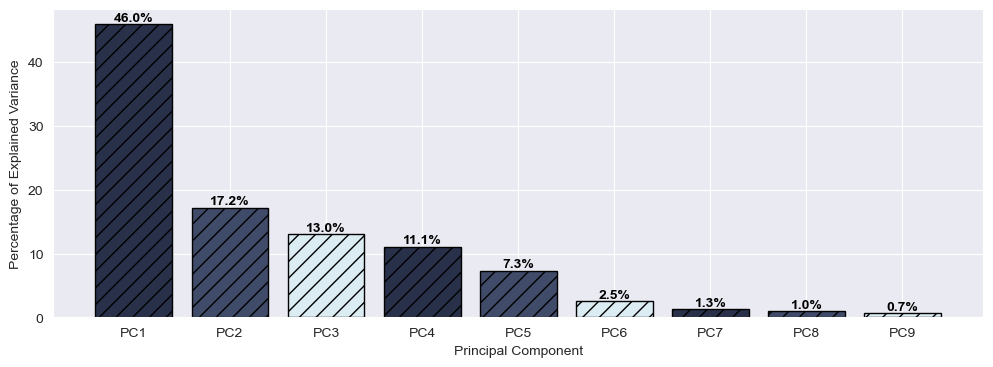

In [92]:
# Variance explained by each dimension
fig, ax = plt.subplots(figsize=(12, 4))
bars = ax.bar(x=range(1, len(per_var)+1), height=per_var, tick_label=labels, color=colors, edgecolor='black', hatch='//')
plt.ylabel('Percentage of Explained Variance')
plt.xlabel('Principal Component')
for i, bar in enumerate(bars):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
            f'{per_var[i]}%', ha='center', va='bottom', color='black', fontweight='bold')
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

- **63.2%** of the variances can be explained by only using the **first 2 dimensions**, with the first dimensions can explain **46%** of the total variances.
---
- We can keep around **94.6%** of the information from our data by using **only 5 dimensions**. This mean that we can actually reduce the number of features on our dataset from **9 to 5 numeric features**.

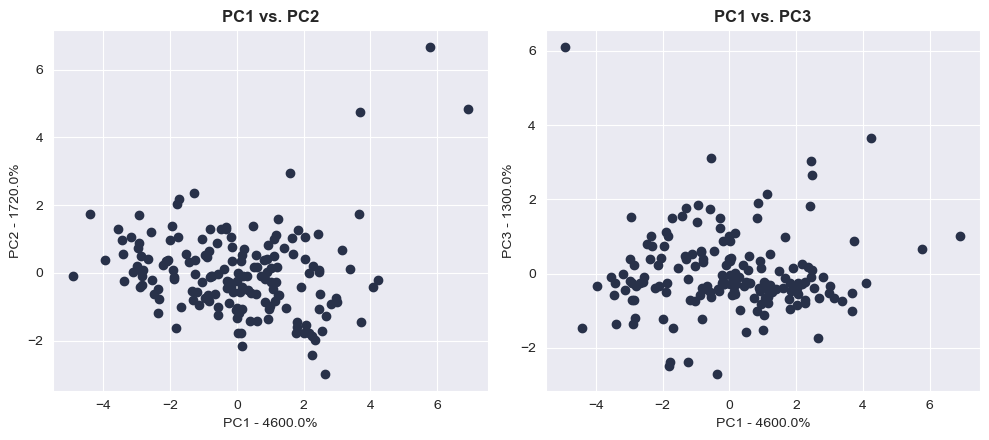

In [93]:
# plot pca
fig, axs = plt.subplots(1, 2, figsize=(10, 4.5))

# plot PCA1 vs PCA2
axs[0].scatter(X_pca[:,0], X_pca[:,1])
axs[0].set_title('PC1 vs. PC2', fontweight='bold')
axs[0].set_xlabel('PC1 - {0:.1f}%'.format(per_var[0]*100))
axs[0].set_ylabel('PC2 - {0:.1f}%'.format(per_var[1]*100))

# plot PCA1 vs PCA3
axs[1].scatter(X_pca[:,0], X_pca[:,2])
axs[1].set_title('PC1 vs. PC3', fontweight='bold')
axs[1].set_xlabel('PC1 - {0:.1f}%'.format(per_var[0]*100))
axs[1].set_ylabel('PC3 - {0:.1f}%'.format(per_var[2]*100))

# adjust the layout and show the figure
plt.tight_layout()
plt.show()

In [94]:
#Principal Component Data Decomposition
colnames = list(df.columns)
pca_df = pd.DataFrame({
    'Features':colnames,
    'PC1':pca.components_[0], 'PC2':pca.components_[1], 'PC3':pca.components_[2], 'PC4':pca.components_[3],
    'PC5':pca.components_[4], 'PC6':pca.components_[5], 'PC7':pca.components_[6], 'PC8':pca.components_[7], 
    'PC9':pca.components_[8]})

pca_df

,Features,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,child_mort,-0.419519,0.192884,-0.029544,0.370653,-0.168970,0.200628,-0.079489,-0.682743,0.327542
1,exports,0.283897,0.613163,0.144761,0.003091,0.057616,-0.059333,-0.707303,-0.014197,-0.123082
2,health,0.150838,-0.243087,-0.596632,0.461897,0.518000,0.007276,-0.249831,0.072497,0.113088
3,imports,0.161482,0.671821,-0.299927,-0.071907,0.255376,-0.030032,0.592190,-0.028946,0.099037
4,income,0.398441,0.022536,0.301548,0.392159,-0.247150,0.160347,0.095562,0.352624,0.612982
5,inflation,-0.193173,-0.008404,0.642520,0.150442,0.714869,0.066285,0.104633,-0.011538,-0.025236
6,life_expec,0.425839,-0.222707,0.113919,-0.203797,0.108220,-0.601127,0.018486,-0.504664,0.294040
7,total_fer,-0.403729,0.155233,0.019549,0.378304,-0.135262,-0.750689,0.028826,0.293353,-0.026336
8,gdpp,0.392645,-0.046022,0.122977,0.531995,-0.180167,0.016779,0.242998,-0.249696,-0.625646


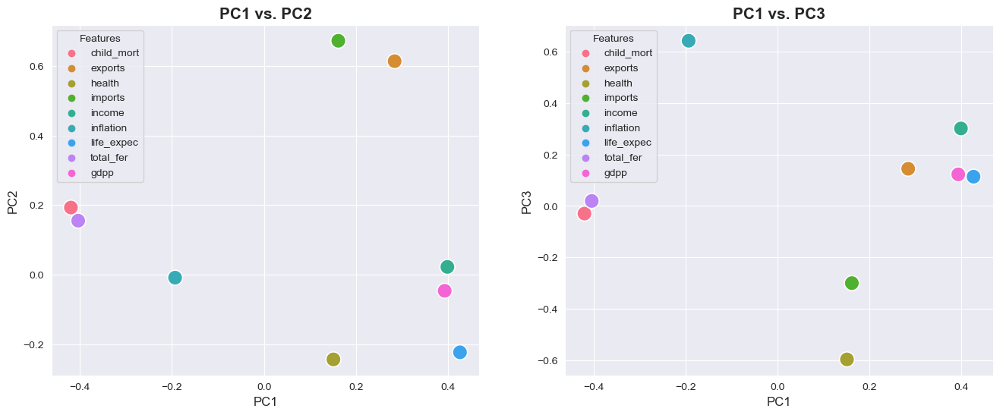

In [95]:
fig, axs = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(pca_df.PC1, pca_df.PC2, hue=pca_df.Features, marker='o', s=200, ax=axs[0])
axs[0].set_title('PC1 vs. PC2', fontweight='bold', fontsize=15)
axs[0].set_xlabel('PC1', fontsize=12)
axs[0].set_ylabel('PC2', fontsize=12)

sns.scatterplot(pca_df.PC1, pca_df.PC3, hue=pca_df.Features, marker='o', s=200, ax=axs[1])
axs[1].set_title('PC1 vs. PC3', fontweight='bold', fontsize=15)
axs[1].set_xlabel('PC1', fontsize=12)
axs[1].set_ylabel('PC3', fontsize=12)

plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

📝**The PCA results above can be interpreted in several ways:**

- **1️⃣One way** is to examine the loadings or coefficients of each variable on the principal components. 
    
    - In this case, we can see that the **PC1** has **positive associations** with **exports, health, imports, income, life_expec**, and **gdpp**, while it has **negative associations** with **child_mort, inflation**, and **total_fer**. 
    ---
    - This means that countries with **high values for the first principal component** are generally stable, as they have **high ratings** for **exports, imports, income, health, life_expec**, and **gdpp**, but **low ratings** for **child_mort, inflation, and total_fer**.
--------
- **2️⃣Another way** to interpret PCA is to look at the values of the coefficients or columns. 
    
    - The **larger the absolute value of the coefficient**, the **more important** the corresponding variable is in calculating the component. For example, the largest absolute value for the column **exports** is on **PC7** compared to other **PCs**, indicating that PC7 contains the most information about the exports variable.

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌To determine the **optimal number of principal components** for analysis, a **scree plot** can be utilized. This plot showcases the explained variance ratio for each principal component, as well as the cumulative explained variance ratio, in relation to the number of principal components. By examining the scree plot, researchers can determine the appropriate number of principal components to retain in their analysis.

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌The **range of variance** that can be considered as a good choice for choosing the **optimum number of components in PCA** is generally **between 70% to 95%**. The decision of choosing the variance range depends on the specific problem at hand and the amount of data available.<blockquote>

- If we have a **small amount of data**, we may need to retain a **higher percentage of variance** to **avoid losing important information**. On the other hand, if we have a **large dataset**, we can consider retaining a **lower percentage of variance**.
------
- In general, the choice of the variance range is a trade-off between reducing the dimensionality of the data and retaining enough information to accurately represent the data. It is often recommended to experiment with different variance thresholds and compare the results to choose the most appropriate one for a specific problem.

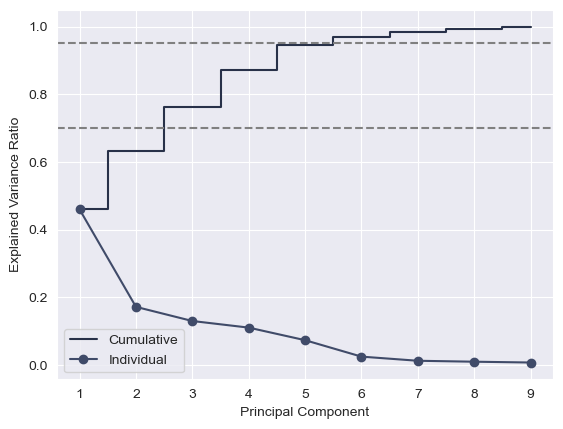

In [96]:
# Create a list of integers from 1 to the number of components
components = list(range(1, len(pca.explained_variance_ratio_) + 1))

# Plot the cumulative explained variance ratio as a step function
plt.step(components, np.cumsum(pca.explained_variance_ratio_), where='mid', label='Cumulative')

# Plot the explained variance ratio for each individual component as a line
plt.plot(components, pca.explained_variance_ratio_, marker='o', label='Individual')

# Add horizontal line between 0.7-0.95 (optimum range)
plt.axhline(y=0.95, color='gray', linestyle='--')
plt.axhline(y=0.7, color='gray', linestyle='--')

# Add axis labels and title
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')

# Add a legend
plt.legend()

plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

📝I will consider a **variance ratio** of **0.9** for this dataset.

In [97]:
# Calculate the cumulative sum of explained variance ratios
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# Find the number of components required to explain 90% of the variance
n_components = np.argmax(cumulative_variance >= 0.9) + 1

# Print the result
print(f'{n_components} principal components explain 90% of the variance.')

5 principal components explain 90% of the variance.


In [98]:
# Initialize PCA with 5 components
pca = PCA(n_components=n_components)

# Fit and transform the scaled data
pca_ = pca.fit_transform(scaled_cols)

# Create a DataFrame from the transformed data
pca_df = pd.DataFrame(pca_, columns=["PC1", "PC2", "PC3", "PC4", "PC5"])
print('\nFinal PCA:')
pca_df


Final PCA:


,PC1,PC2,PC3,PC4,PC5
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475
3,-2.932423,1.695555,1.525044,0.839625,-0.273209
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581
164,0.498524,1.390744,-0.238526,-1.074098,1.176081
165,-1.887451,-0.109453,1.109752,0.056257,0.618365


<a id="1"></a>  
#### <p style="padding:5px;background-color:#404B69;margin:0;color:#DBDBDB;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 5px 5px;overflow:hidden;font-weight:200"> 6.3. k-means Clustering
 </p>

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌**k-means Clustering** is a popular unsupervised machine learning algorithm used to identify patterns and structure in data. It works by grouping similar data points together into clusters based on their distance from one another.

The algorithm is particularly well-suited for datasets with continuous numerical features, as it calculates distances between data points in n-dimensional space. However, it does not support categorical features, as it relies on numeric distances to measure similarity.

<blockquote>
    
- To start the algorithm, k centroids are chosen randomly, where k is the number of desired clusters. The distances between each data point and the centroids are then calculated, and each data point is assigned to the nearest centroid.
---
- Once all data points have been assigned to a centroid, the average value of the data points within each cluster is calculated, and these average values are defined as the new centroids. The process repeats itself until both centroids converge to fixed points, at which point the algorithm terminates.

<blockquote>    
    
- One of the main benefits of K-Means Clustering is its simplicity and speed, as it can handle large datasets and converge quickly. However, the algorithm is sensitive to initial centroid placement and can be prone to getting stuck in local optima, so multiple runs with different initial centroids are often used to improve results.
---
- K-Means Clustering has a wide range of applications, such as customer segmentation, image segmentation, and anomaly detection, and it is a valuable tool for exploratory data analysis and data preprocessing.

In [99]:
# Set the parameters for the KMeans algorithm
kmeans_params = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 1,
                 "tol": 1e-4, "algorithm": "auto", "verbose": 0}

In [100]:
# Perform KMeans clustering for different values of k and store the inertia values
inertia_values = []
for num_clusters in range(1, 11):
    kmeans = KMeans(n_clusters=num_clusters, **kmeans_params)
    kmeans.fit(pca_df)
    inertia_values.append(kmeans.inertia_)

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌The **elbow method** is a popular technique for determining the optimal number of clusters in a clustering algorithm. It involves plotting the within-cluster sum of squares against the number of clusters and identifying the "elbow" point where the rate of decrease in the sum of squares slows down.

In [101]:
def elbow_optimizer(inertia_values, name):
    """ Find optimom k for clustering algorithm
        inertias (list): list that has inertia for each selected k
        name (string): name of clustering algorithm
    """

    kl = KneeLocator(range(1,11), inertia_values, curve='convex', direction="decreasing")
    plt.style.use("fivethirtyeight")
    sns.lineplot(x=range(1,11), y=inertia_values, color=colors[1], linewidth=3)
    plt.xticks(range(1,11))
    plt.xlabel("Number of Clusters", labelpad=20, fontsize=12)
    plt.ylabel("Inertia", labelpad=20, fontsize=12)
    plt.title(f"Elbow Method for {name}", y=1.09, fontsize=14)
    plt.axvline(x=kl.elbow, color= 'grey', label='Elbow', ls='--', linewidth=3)
    plt.legend()
    plt.tight_layout()
    plt.show()

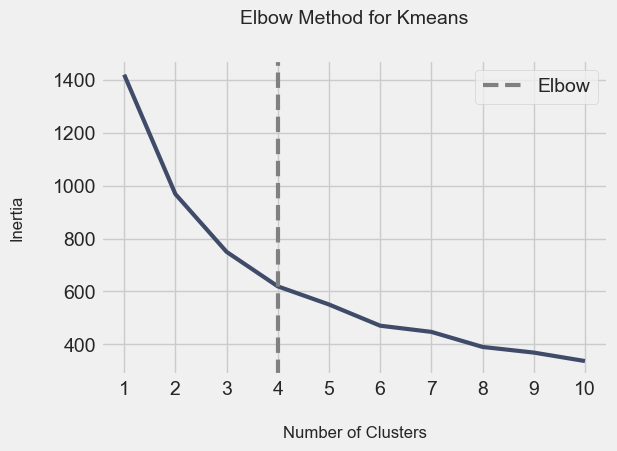

In [102]:
# Implement elbow_optimizer function for KMeans
elbow_optimizer(inertia_values, 'Kmeans')

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌We have utilized the **Silhouette Coefficient** and the **Calinski-Harabasz Coefficient** to evaluate the efficacy of our clustering approach.

<blockquote> 
        
   - **Silhouette Coefficient** is a metric used to evaluate the quality of clustering in unsupervised learning. It measures how similar an object is to its own cluster compared to other clusters. The silhouette coefficient ranges from -1 to 1, with 1 indicating that the object is well-matched to its own cluster and poorly matched to neighboring clusters, while -1 indicates that the object is poorly matched to its own cluster and well-matched to neighboring clusters. A value close to 0 indicates that the object is close to the boundary between two clusters. A higher Silhouette coefficient score indicates that the clustering model has generated well-separated and distinct clusters, and the objects are correctly assigned to their respective clusters. Silhouette coefficient is widely used in clustering tasks because it is easy to calculate and interpret, and it works well with many different types of clustering algorithms.
---
   - **Calinski-Harabasz Coefficient** is another metric used to evaluate the quality of clustering in unsupervised learning. It measures the ratio of the between-cluster variance to the within-cluster variance. A higher Calinski-Harabasz coefficient indicates that the clusters are more separated and distinct from each other. This means that the clustering model has generated well-separated and distinct clusters, and the objects are correctly assigned to their respective clusters. The Calinski-Harabasz coefficient is particularly useful when comparing different clustering algorithms or when selecting the optimal number of clusters in the data. However, the main drawback of the Calinski-Harabasz coefficient is that it can be sensitive to outliers, so it is important to preprocess the data and remove any outliers before using this metric to evaluate clustering models.


In [103]:
# Calculate silhouette coefficient and calinski harabasz coefficient
silhouette_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(pca_df)
    score = silhouette_score(pca_df, kmeans.labels_)
    silhouette_coef.append(score)

calinski_harabasz_coef = []
for k in range(2,11):
    kmeans = KMeans(n_clusters=k, **kmeans_params)
    kmeans.fit(pca_df)
    score = calinski_harabasz_score(pca_df, kmeans.labels_)
    calinski_harabasz_coef.append(score)

In [104]:
# Create a dataframe to store the scores
scores_kmeans = pd.DataFrame({'k': range(2,11),
'Silhouette Score': silhouette_coef,
'Calinski-Harabasz Score': calinski_harabasz_coef})

# Find the best k for each score
best_k_silhouette = scores_kmeans.loc[scores_kmeans['Silhouette Score'].idxmax(), 'k']
best_k_calinski_harabaz = scores_kmeans.loc[scores_kmeans['Calinski-Harabasz Score'].idxmax(), 'k']

In [105]:
print("\nScores for Different Numbers of Clusters:")
scores_kmeans.style.background_gradient(cmap=cmap2).set_properties(**{'font-family': 'Segoe UI'}).hide_index()


Scores for Different Numbers of Clusters:


k,Silhouette Score,Calinski-Harabasz Score
2,0.304420,77.065351
3,0.307977,73.419864
4,0.327183,70.399841
5,0.249472,64.081770
6,0.261899,65.165453
7,0.256239,58.202775
8,0.265994,60.153751
9,0.244556,56.486875
10,0.231757,56.318143


In [106]:
def plot_evaluation(sh_score, ch_score, name, x=range(2,11)):
    """
    for draw evaluation plot include silhouette_score and calinski_harabasz_score.
        sh_score(list): include silhouette_score of models
        ch_score(list): include calinski_harabasz_score of models
        name(string): name of clustering algorithm
        x(list): has range of number for x axis
    """
    
    fig, ax = plt.subplots(1,2,figsize=(15,7), dpi=100)
    ax[0].plot(x, sh_score, color=colors[1], marker='o', ms=9, mfc=colors[-1])
    ax[1].plot(x, ch_score, color=colors[1], marker='o', ms=9, mfc=colors[-1])
    ax[0].set_xlabel("Number of Clusters", labelpad=20)
    ax[0].set_ylabel("Silhouette Coefficient", labelpad=20)
    ax[1].set_xlabel("Number of Clusters", labelpad=20)
    ax[1].set_ylabel("calinski Harabasz Coefficient", labelpad=20)
    plt.suptitle(f'Evaluate {name} Clustering',y=0.9)
    plt.tight_layout(pad=3)
    plt.show()

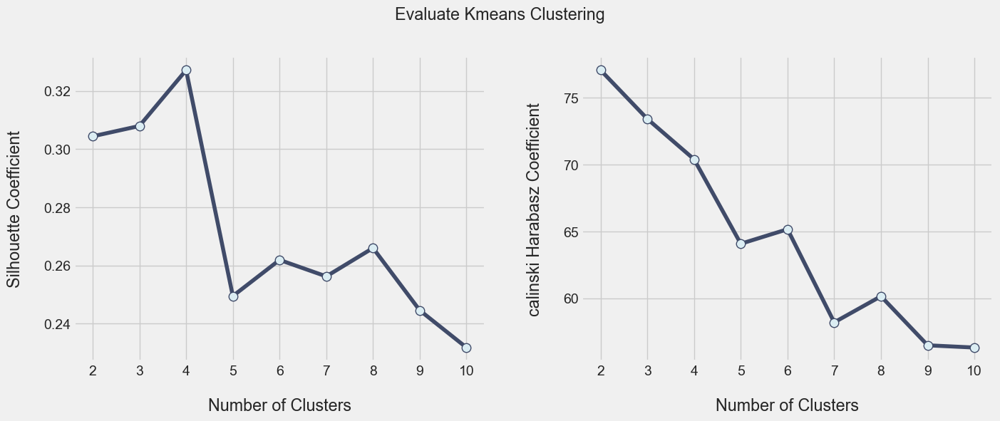

In [107]:
# Visualize plots of silhouette and calinski harabasz scores for kmeans models
plot_evaluation(silhouette_coef, calinski_harabasz_coef, 'Kmeans')

In [108]:
# Best k for each coef
print(f"\n▪️Best k for Silhouette Coefficient: {best_k_silhouette}")
print(f"▪️Best k for Calinski-Harabasz Coefficient: {best_k_calinski_harabaz}")


▪️Best k for Silhouette Coefficient: 4
▪️Best k for Calinski-Harabasz Coefficient: 2


<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌When we have **multiple evaluation metrics** with **different** best values for **k**, it can be challenging to decide which one to use to choose the number of clusters for your clustering model.<blockquote>

1️⃣**One approach** could be to look at the characteristics of the clustering results for each k value suggested by the two metrics and compare them to the domain knowledge or business requirements. This can help to identify the k value that leads to the most meaningful or useful clusters.

2️⃣**Another approach** could be to use a hybrid metric that combines multiple evaluation metrics into a single score. For instance, you could use the geometric mean of the Silhouette Score and the Calinski-Harabasz Score to rank the k values and choose the one with the highest hybrid score. This approach can help to balance the strengths and weaknesses of different evaluation metrics and reduce the risk of overfitting to a single metric.

In [109]:
# Using hybrid score to find the best k
def select_k(pca_df):
    silhouette_scores = []
    calinski_scores = []
    k_values = range(2, 11)

    for k in k_values:
        # Perform clustering using k-means algorithm
        kmeans = KMeans(n_clusters=k, **kmeans_params)
        labels = kmeans.fit_predict(pca_df)

        # Calculate Silhouette Score
        silhouette_scores.append(silhouette_score(pca_df, labels))

        # Calculate Calinski-Harabasz Score
        calinski_scores.append(calinski_harabasz_score(pca_df, labels))

    hybrid_scores = np.sqrt(np.multiply(silhouette_scores, calinski_scores))
    best_k = k_values[np.argmax(hybrid_scores)]
    return best_k

In [110]:
best_k = select_k(pca_df)
print("\n✅Best value of k:", best_k)


✅Best value of k: 2


<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌Despite the obtained best k from the **hybrid score being 2**, however, based on the characteristics of the dataset and the first approach, it has been determined that implementing the k-means clustering model with **4 clusters** would yield **more meaningful results**.<blockquote>
    
- Implementing a clustering model with 4 clusters means that the dataset will be divided into four distinct groups. Each group will contain data points that are similar to each other and different from the other groups. The clustering algorithm will work by iteratively comparing the similarity of each data point to the other data points in the dataset, and assigning it to the appropriate cluster based on the similarity criteria.

In [111]:
# Implement kmeans clustering with n_clusters=4
kmeans = KMeans(n_clusters=4, **kmeans_params).fit(pca_df)

# Store result of kmeans
pred = kmeans.labels_

# Get the coordinates of the centroids of the three clusters
centroids = kmeans.cluster_centers_

# Convert the centroids array to a DataFrame and assign column names
centroids = pd.DataFrame(centroids, columns = pca_df.columns)
centroids

,PC1,PC2,PC3,PC4,PC5
0,2.585905,-0.866690,0.075067,0.982564,-0.260166
1,5.460225,5.432473,0.211648,0.906058,0.455229
2,-2.434620,0.411276,-0.096167,0.691710,-0.141458
3,0.235279,-0.110651,0.018769,-0.743741,0.150435


In [112]:
# Calculate scores
silhouette = silhouette_score(pca_df, pred)
calinski = calinski_harabasz_score(pca_df, pred)

# Create a DataFrame with the scores
km_scores = pd.DataFrame({'Silhouette Score': [silhouette], 'Calinski-Harabasz Score': [calinski]}, index=['k-means'])
km_scores

,Silhouette Score,Calinski-Harabasz Score
k-means,0.327183,70.399841


In [113]:
km_clustered_df = pd.concat([pca_df, pd.DataFrame(pred, columns=['k-means Cluster'])], axis = 1)
km_clustered_df

,PC1,PC2,PC3,PC4,PC5,k-means Cluster
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310,2
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677,3
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475,3
3,-2.932423,1.695555,1.525044,0.839625,-0.273209,2
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007,3
...,...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748,3
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581,3
164,0.498524,1.390744,-0.238526,-1.074098,1.176081,3
165,-1.887451,-0.109453,1.109752,0.056257,0.618365,2


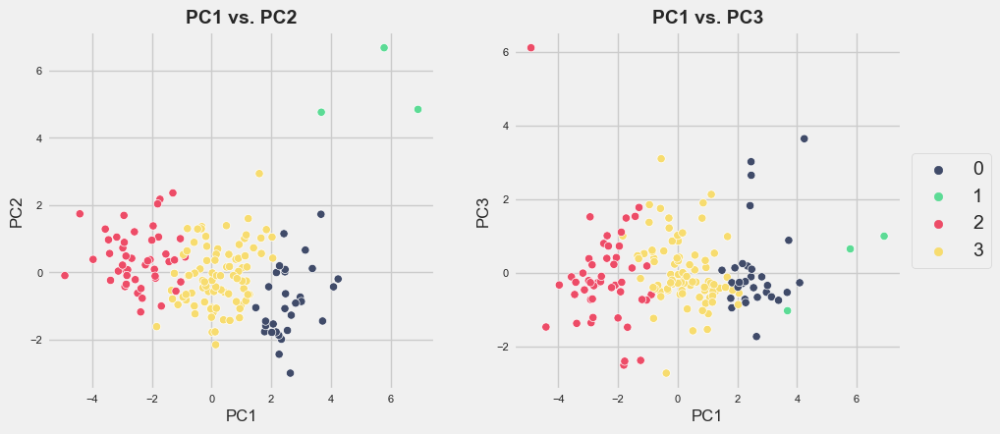

In [114]:
# create subplots with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(10, 4.5))

# plot on first axis
axs[0].set_title('PC1 vs. PC2', fontweight='bold', fontsize=14)
axs[0].set_xlabel('PC1', fontsize=12)
axs[0].set_ylabel('PC2', fontsize=12)
axs[0].tick_params(axis='both', which='major', labelsize=8)
sns.scatterplot(x='PC1', y='PC2', hue='k-means Cluster', data=km_clustered_df, ax=axs[0], palette=colors3, legend=False)

# plot on second axis
axs[1].set_title('PC1 vs. PC3', fontweight='bold', fontsize=14)
axs[1].set_xlabel('PC1', fontsize=12)
axs[1].set_ylabel('PC3', fontsize=12)
axs[1].tick_params(axis='both', which='major', labelsize=8)
sns.scatterplot(x='PC1', y='PC3', hue='k-means Cluster', data=km_clustered_df, ax=axs[1], palette=colors3)
axs[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

In [115]:
# Addition of cluster column to the dataframe
kmeans_clustered_df = df.copy()
kmeans_clustered_df ['k-means Cluster'] = pred
kmeans_clustered_df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
country,,,,,,,,,,
Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,2
Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,3
Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,3
Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,2
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,3
...,...,...,...,...,...,...,...,...,...,...
Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,3
Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,3
Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,3


In [116]:
# Size of the clusters
km_clusts_sizes = kmeans_clustered_df.groupby('k-means Cluster').size().to_frame()
km_clusts_sizes.columns = ["Cluster Size"]
km_clusts_sizes

,Cluster Size
k-means Cluster,
0,30
1,3
2,47
3,87


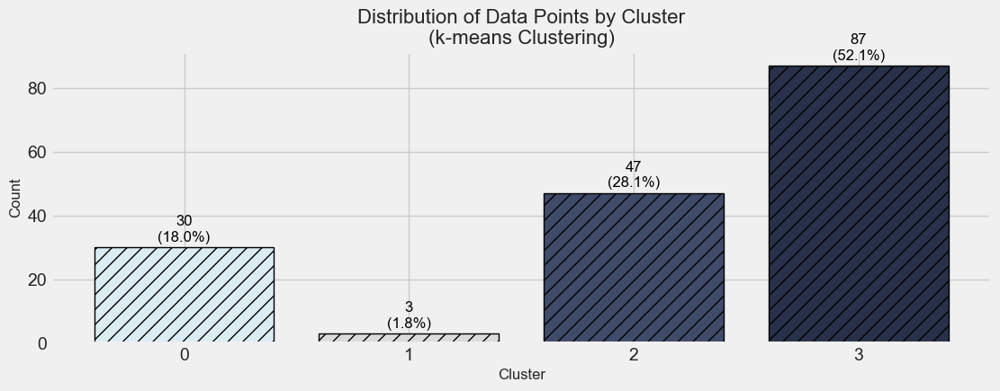

In [117]:
# Distribution of Data Points by Cluster
counts = kmeans_clustered_df['k-means Cluster'].value_counts()
labels = counts.index.tolist()
sizes = counts.tolist()

# Calculate percentages and counts
total = sum(sizes)
percentages = [(size / total) * 100 for size in sizes]
counts = [f'{size}\n({percentages[i]:.1f}%)' for i, size in enumerate(sizes)]

# Create the bar plot
plt.figure(figsize=(12, 4))
bars = plt.bar(labels, sizes, color=my_palette, edgecolor='black', linewidth=1, hatch='//')
plt.xticks(range(len(labels)), [str(i) for i in range(len(labels))])

# Add counts to bars
for i, bar in enumerate(bars):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 1,
             counts[i], ha='center', va='bottom', color='black', fontsize=12)

# Set the axis labels and title
plt.xlabel('Cluster', fontsize= 12)
plt.ylabel('Count', fontsize= 12)
plt.title('Distribution of Data Points by Cluster\n(k-means Clustering)', fontsize= 16)
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝Explenations:**

The countries can be divided into four clusters based on certain characteristics. 
- The largest cluster (3), with 87 countries, covers over 50% of the total number of countries. 
- The second largest cluster (2), with 47 countries, covers approximately 28% of the total. 
- The third cluster largest (0) covers 18% of the overall countries, comprising 30 countries. 
- Finally, the smallest cluster (1) consists of only 3 countries, representing a mere 1.8% of the total count.

In [118]:
# Cluster 1
kmeans_clustered_df[kmeans_clustered_df['k-means Cluster'] == 0][:10]

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
country,,,,,,,,,,
Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,0
Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,0
Belgium,4.5,76.4,10.70,74.7,41100,1.880,80.0,1.86,44400,0
Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300,0
Canada,5.6,29.1,11.30,31.0,40700,2.870,81.3,1.63,47400,0
Cyprus,3.6,50.2,5.97,57.5,33900,2.010,79.9,1.42,30800,0
Denmark,4.1,50.5,11.40,43.6,44000,3.220,79.5,1.87,58000,0
Finland,3.0,38.7,8.95,37.4,39800,0.351,80.0,1.87,46200,0
France,4.2,26.8,11.90,28.1,36900,1.050,81.4,2.03,40600,0


In [119]:
# Cluster 2
kmeans_clustered_df[kmeans_clustered_df['k-means Cluster'] == 1][:10]

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
country,,,,,,,,,,
Luxembourg,2.8,175.0,7.77,142.0,91700,3.620,81.3,1.63,105000,1
Malta,6.8,153.0,8.65,154.0,28300,3.830,80.3,1.36,21100,1
Singapore,2.8,200.0,3.96,174.0,72100,-0.046,82.7,1.15,46600,1


In [120]:
# Cluster 3
kmeans_clustered_df[kmeans_clustered_df['k-means Cluster'] == 2][:10]

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
country,,,,,,,,,,
Afghanistan,90.2,10.00,7.58,44.9,1610,9.440,56.2,5.82,553,2
Angola,119.0,62.30,2.85,42.9,5900,22.400,60.1,6.16,3530,2
Benin,111.0,23.80,4.10,37.2,1820,0.885,61.8,5.36,758,2
Botswana,52.5,43.60,8.30,51.3,13300,8.920,57.1,2.88,6350,2
Burkina Faso,116.0,19.20,6.74,29.6,1430,6.810,57.9,5.87,575,2
Burundi,93.6,8.92,11.60,39.2,764,12.300,57.7,6.26,231,2
Cameroon,108.0,22.20,5.13,27.0,2660,1.910,57.3,5.11,1310,2
Central African Republic,149.0,11.80,3.98,26.5,888,2.010,47.5,5.21,446,2
Chad,150.0,36.80,4.53,43.5,1930,6.390,56.5,6.59,897,2


In [121]:
# Cluster 4
kmeans_clustered_df[kmeans_clustered_df['k-means Cluster'] == 3][:10]

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
country,,,,,,,,,,
Albania,16.6,28.0,6.55,48.6,9930,4.490,76.3,1.65,4090,3
Algeria,27.3,38.4,4.17,31.4,12900,16.100,76.5,2.89,4460,3
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.440,76.8,2.13,12200,3
Argentina,14.5,18.9,8.10,16.0,18700,20.900,75.8,2.37,10300,3
Armenia,18.1,20.8,4.40,45.3,6700,7.770,73.3,1.69,3220,3
Azerbaijan,39.2,54.3,5.88,20.7,16000,13.800,69.1,1.92,5840,3
Bahamas,13.8,35.0,7.89,43.7,22900,-0.393,73.8,1.86,28000,3
Bahrain,8.6,69.5,4.97,50.9,41100,7.440,76.0,2.16,20700,3
Bangladesh,49.4,16.0,3.52,21.8,2440,7.140,70.4,2.33,758,3


In [122]:
# Summarizing the average values of each feature within each cluster
avg_df = kmeans_clustered_df.groupby(['k-means Cluster'], as_index=False).mean()
avg_df.style.background_gradient(cmap=cmap2).set_properties(**{'font-family': 'Segoe UI'}).hide_index()

k-means Cluster,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,4.953333,45.826667,9.168667,39.736667,45250.000000,2.742200,80.376667,1.795333,43333.333333
1,4.133333,176.000000,6.793333,156.666667,64033.333333,2.468000,81.433333,1.380000,57566.666667
2,92.961702,29.151277,6.388511,42.323404,3942.404255,12.019681,59.187234,5.008085,1922.382979
3,21.389655,41.290678,6.235862,48.038689,12968.620690,7.413460,72.935632,2.286552,6919.103448


<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌However, having a group of only 3 countries (Cluster 2) raises questions about the validity of the clustering. Therefore, it would be helpful to visualize the data according to the classification to better understand the characteristics of the countries in each group.

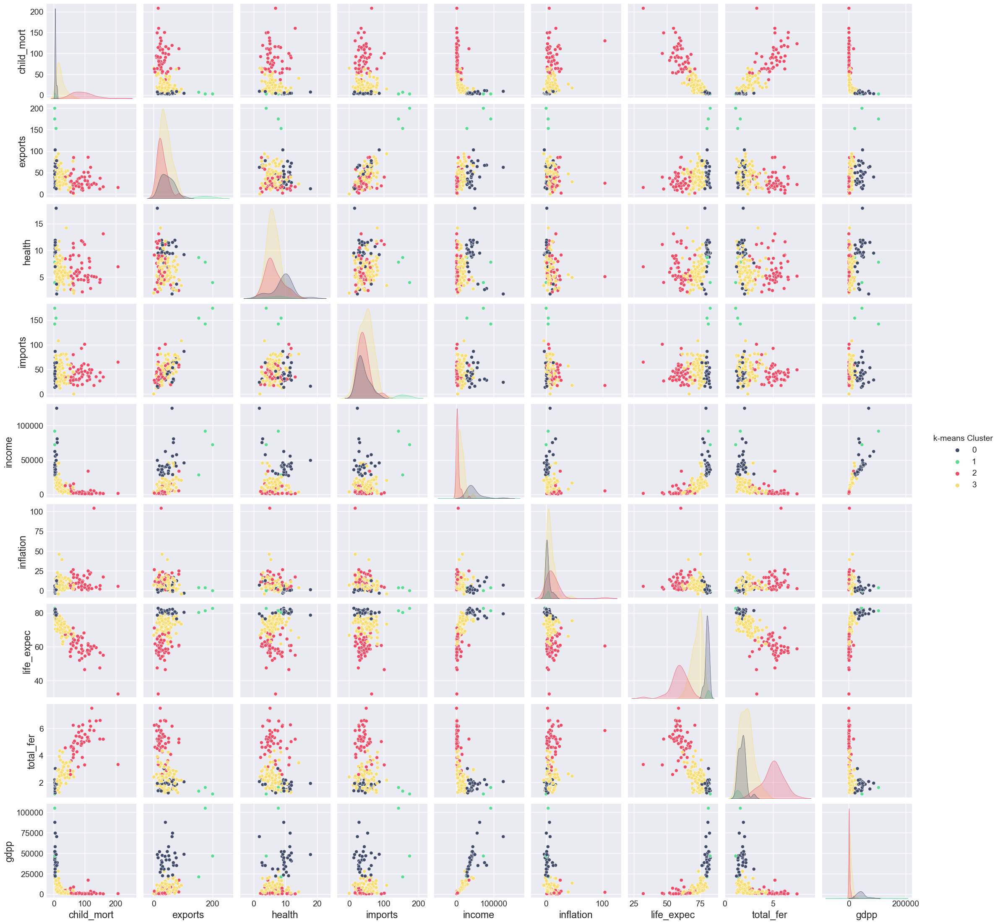

In [123]:
sns.set_style('darkgrid')
sns.pairplot(kmeans_clustered_df, hue='k-means Cluster', palette=colors3)
plt.show()

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌We can visualize the relationship between features, and the labelled clusters using boxplots.

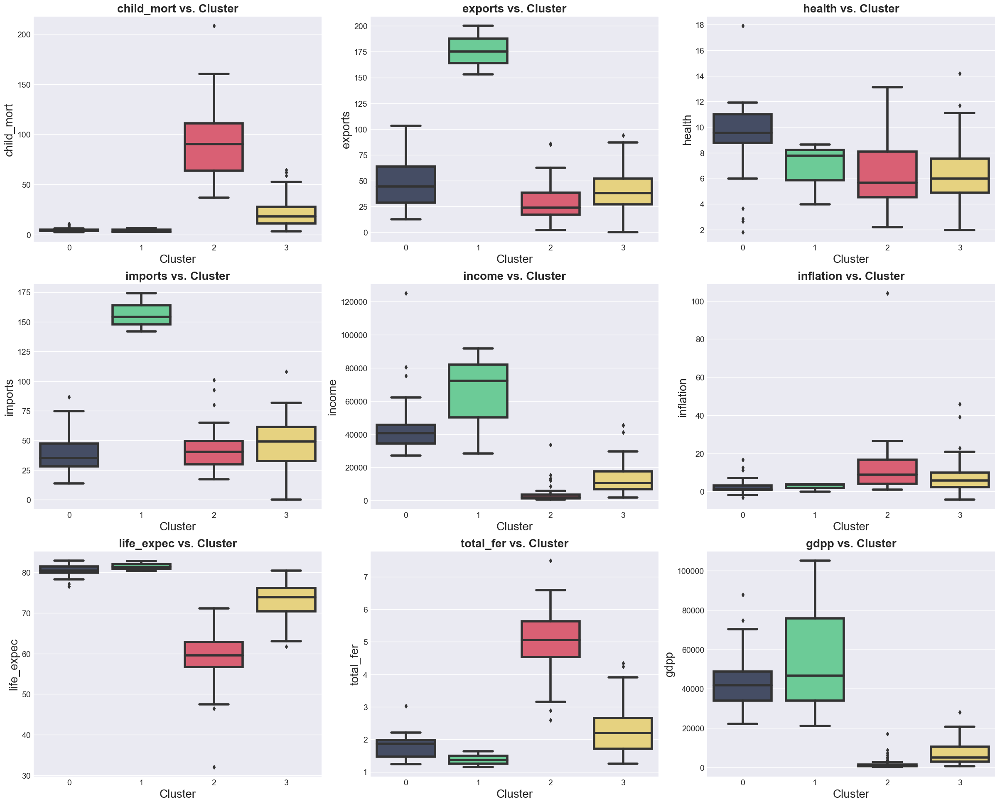

In [124]:
# Create subplots with 3 rows and 3 columns, and set the figure size
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(25,20), sharex=False, sharey=False)

# Add padding between the subplots
fig.tight_layout(pad=3.5)

# Loop through each feature in the data frame
for i, feature in enumerate(kmeans_clustered_df.columns[:-1]):
    # Create a box plot for the current feature
    sns.boxplot(x='k-means Cluster', y=feature, data=kmeans_clustered_df, palette=colors3, ax=ax[i//3, i%3])
    ax[i//3, i%3].set_title('{} vs. Cluster'.format(feature), fontweight='bold', fontsize=20)
    ax[i//3, i%3].set_xlabel('Cluster', fontsize=20)
    ax[i//3, i%3].set_ylabel(feature, fontsize=20)

plt.show()

<div style="background-color:#DBEDF3; padding:20px; font-size:15px">

📌Based on our analysis in the EDA section:<blockquote>
    
- In particular, if we see that one or more clusters have a **higher concentration** of countries with **lower income and higher child mortality**, then we can conclude that these clusters represent **economically disadvantaged nations**. **By contrast**, if we see that some clusters have a **lower concentration** of such countries, then we can infer that those clusters may represent **more economically stable nations**.
---
- Therefore, by examining the boxplots of **Income or GDP, Life expectancy, Total fertility, and Child mortality** across the different clusters, we can gain insights into the economic status of the nations in our dataset and how they are grouped together.

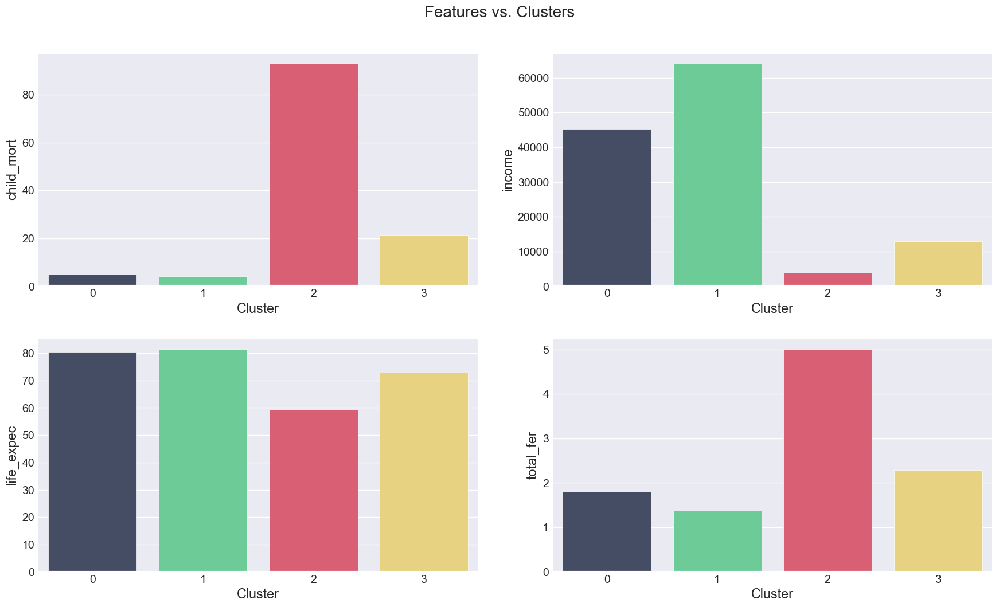

In [125]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 11))

for i, col in enumerate(['child_mort', 'income', 'life_expec', 'total_fer']):
    sns.barplot(x='k-means Cluster', y=col, data=avg_df, ax=axes[i//2, i%2], palette=colors3)
    axes[i//2, i%2].set_xlabel('Cluster')
    axes[i//2, i%2].set_ylabel(col)

plt.suptitle('Features vs. Clusters', fontsize=20)
fig.tight_layout(pad=2.0)
plt.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">

**📝The Characteristics of Countries for each Class from 0️⃣to3️⃣:**

- **Class**0️⃣ --> (30 Countries) --> Developed Countries --> Level 1 or 2 --> ⚫No Need for Financial Aid (Maybe in terms of some aspects)
    - Characteristics: low 'Child mortality', high 'Income', high 'Life expectancy', and low 'Total fertility'
    ---
- **Class**1️⃣ --> (3 Countries) --> Highly Developed Countries --> Level 1 --> 🟢No Need for Financial Aid
    - Characteristics: low 'Child mortality', high 'Income', high 'Life expectancy', and low 'Total fertility' 
    ---
- **Class**2️⃣ --> (47 Countries) --> Not Developed Countries --> Level 4 --> 🔴Need Financial Aid
    - Characteristics: high 'Child mortality', low 'Income', middle 'Life expectancy', and high 'Total fertility'
    ---
- **Class**3️⃣ --> (87 Countries) --> Developing Countries --> Level 2 or 3 --> 🟡Might Need Financial Aid
    - Characteristics: middle 'Child mortality', low 'Income', middle 'Life expectancy', and middle 'Total fertility'

In [126]:
kmeans_clustered_df = kmeans_clustered_df.reset_index()
kmeans_clustered_df.loc[kmeans_clustered_df['k-means Cluster'] == 0, 'k-means Cluster'] = 'No Need for Financial Aid\n(Maybe in terms of some aspects)'
kmeans_clustered_df.loc[kmeans_clustered_df['k-means Cluster'] == 1, 'k-means Cluster'] = 'No Need for Financial Aid'
kmeans_clustered_df.loc[kmeans_clustered_df['k-means Cluster'] == 2, 'k-means Cluster'] = 'Need Financial Aid'
kmeans_clustered_df.loc[kmeans_clustered_df['k-means Cluster'] == 3, 'k-means Cluster'] = 'Might Need Financial Aid'
kmeans_clustered_df.head(5)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,k-means Cluster
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,Need Financial Aid
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,Might Need Financial Aid
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,Might Need Financial Aid
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,Need Financial Aid
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,Might Need Financial Aid


In [127]:
# Create a choropleth map of k-means clusters
world_help_clusters = px.choropleth(
    data_frame=kmeans_clustered_df,
    locations='country', 
    locationmode='country names', 
    color='k-means Cluster',
    color_discrete_map={
        'No Need for Financial Aid\n(Maybe in terms of some aspects)': '#404B69',
        'No Need for Financial Aid': '#5CDB95', 
        'Need Financial Aid': '#ED4C67', 
        'Might Need Financial Aid': '#F7DC6F'
    }, 
    title='Worldwide Financial Aid Needs and Priorities',
    labels={'k-means Cluster': 'Labels'}
)

world_help_clusters.update_geos(
    fitbounds="locations",
    projection=dict(type='natural earth')
)
world_help_clusters.update_layout(
    legend_title_text='Labels', 
    legend_title_side='top', 
    title_pad_l=260, 
    title_y=0.86
)

# Show the figure
world_help_clusters.show()

<div style="border-radius:5px;border:#283149 solid;background-color:#FFFFFF; padding:20px; font-size:15px">
    
### 📝Conclusion:
    

**Class** 0️⃣: Developed Countries (30 countries)
  - These countries (Australia, North America and most European countries) are highly developed and have a very high standard of living. They have a highly diversified and advanced economy, excellent healthcare systems, and a strong focus on education. The countries in this class have low child mortality rates, high income and GDP levels, high life expectancies, and low total fertility rates. They have a strong infrastructure and are mostly self-sufficient, but may still require financial aid in some aspects, such as disaster relief or refugee support.

**Class** 1️⃣: Highly Developed Countries (3 countries)
  - These countries (Luxembourg, Malta, and Singapore) are considered the most developed in the world. They have the highest standard of living and the highest level of development across all areas, including education, healthcare, and economy. The countries in this class have low child mortality rates, high income and GDP levels, high life expectancies, and low total fertility rates. They have a strong infrastructure and are largely self-sufficient, with no need for financial aid.

**Class** 2️⃣: Not Developed Countries (47 countries)
  - These countries (Most African countries) are the least developed and have the lowest standard of living. They have a predominantly agricultural economy and lack a strong infrastructure, with limited access to education and healthcare. The countries in this class have high child mortality rates, low income and GDP levels, middle life expectancies, and high total fertility rates. They are heavily reliant on foreign aid and assistance to support their basic needs, such as food, water, and shelter.

**Class** 3️⃣: Developing Countries (87 countries)
  - These countries (Most Asian and South American countries) are transitioning from being underdeveloped to developed. They have made significant progress in areas such as education, healthcare, and economy, but still have a long way to go. The countries in this class have middle child mortality rates, middle low income and GDP levels, middle life expectancies, and middle total fertility rates. They have a partially developed infrastructure and may require financial aid to support their growth and development. Depending on their progress, they may require financial aid for specific aspects of development or emergencies.

<div <h3 style="border-radius:5px;border:#283149 solid;padding: 20px;background-color:#DBEDF3;font-size:90%;text-align:center">
</h3>
      <h4 class="alert-heading">Thank you for taking the time to consider this matter</h4>
  <hr> 
  <h4><b>Author:</b> Ali Farahmandfar </h4>
  <hr>    
    
<h4><strong> 💫Best Wishes💫 </strong>